<a href="https://colab.research.google.com/github/Mintas/diving-deep-learning/blob/master/CALO_CGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!ls
%cd /
%cd /content
!git clone https://github.com/Mintas/diving-deep-learning.git
%cd diving-deep-learning/
!git checkout origin/CGAN_upd
#!git fetch
#!git pull origin CGAN_upd

sample_data
/
/content
Cloning into 'diving-deep-learning'...
remote: Enumerating objects: 67, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 506 (delta 32), reused 47 (delta 19), pack-reused 439
Receiving objects: 100% (506/506), 138.07 MiB | 46.86 MiB/s, done.
Resolving deltas: 100% (309/309), done.
/content/diving-deep-learning
Note: checking out 'origin/CGAN_upd'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at a7af1e2 optional plotting cluster shape stats


In [0]:
!cat /proc/meminfo

In [0]:
!cat /proc/cpuinfo

In [2]:
!ls
%cd diving-deep-learning/

diving-deep-learning  sample_data
/content/diving-deep-learning


In [0]:
from __future__ import print_function
# %matplotlib inline
import random
import torch
import torch.nn as nn
import torch.utils.data

import domain.ecaldata
import domain.parameters

import training.losses
import training.optimDecorators
from plots import painters, plotUi
import mygan
import architectures.cLinearDeep as myzoo#dcganBatchNorm as myzoo linearGan21062019
isDcgan = False
from training import trainer
import numpy as np
from serialization import iogan

from analytics import analytic_funcs as AF
from analytics import optimized_analytic_funcs as OAF
from os.path import dirname
import matplotlib.pyplot as plt
from timeit import default_timer as timer
import regression.caloreg as caloreg




In [4]:
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")
device

device(type='cuda', index=0)

In [6]:
from google.colab import drive
drive.mount('/ecal')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /ecal


In [5]:
%cd /
%cd ecal/My Drive/ecal

# dataSet = myfuncs.ProbDistrDataset(torch.distributions.normal.Normal(0,1), 128000)
datasetName = 'joined_b100_1_and_v4_34k10' #'caloGAN_batch100_1of2'#'joined_v4_2k50_345k10'#'joined_v4_3_10K_4_10K'
ecalData = np.load('%s.npz' % datasetName)

/
/ecal/My Drive/ecal


In [6]:
%cd /
%cd content/diving-deep-learning/
%mkdir resources/computed

archVersion = 'cLinearDeep_WGAN' #arch version
resultingName = 'resources/computed/%s_%s' % (datasetName, archVersion)

/
/content/diving-deep-learning
mkdir: cannot create directory ‘resources/computed’: File exists


In [7]:
# Set fixed random seed for reproducibility
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  999


In [8]:

nc = 1  # we got 1channel response
nz = 100 # latent space size | 42 is close to hypotenuse of response 30x30
imgSize = 30  # our respons is 30x30
conditionSize=5
ngf = 100  # todo : decide Generator feature-space characteristic size
#ndf = 30  # decide Critic feature-space characteristic size
lr = 0.00015 #for 1k samples  # Learning rate for optimizers | 0.04 is good for SGD and 0.0001 for RMSProp
beta1 = 0.5  # Beta1 hyperparam for Adam optimizers
ngpu = 1 if device else 0  # increase for GPU hosted calculations
gpWeight = 10 # gradient penalty weight; somehow 0.1 is nice, 1 is so so, 10 is bad, 0.01 is vanishing
type = mygan.GANS.WGAN#CRAMER # we are going to try gan, wgan-gp and cramerGan
initOptimizer = training.optimDecorators.optRMSProp  # works almost as well for SGD and lr = 0.03

hyperParams = domain.parameters.HyperParameters(ngpu, lr, beta1)
# Decide which device we want to run on
if device is None: device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")



def initNet(netClass, hp, prblm, dvc):
    net = netClass(type, hp, prblm).to(dvc)
    # Handle multi-gpu if desired
    if (device.type == 'cuda') and (ngpu > 1):
        net = nn.DataParallel(net, list(range(ngpu)))
    net.apply(mygan.weights_init)
    #print(net)  # Print the model
    return net
  
problem = domain.parameters.ProblemSize(nz, ngf, nc, 1000, imgSize, conditionSize)
                                         
netG = initNet(myzoo.GenEcal, hyperParams, problem, device)
netD = initNet(myzoo.DiscEcal, hyperParams, problem, device)
print(netG)
print(netD)
                 

GenEcal(
  (l1): Sequential(
    (0): Linear(in_features=105, out_features=200, bias=True)
    (1): ReLU()
  )
  (l2): Sequential(
    (0): Linear(in_features=205, out_features=400, bias=True)
    (1): ReLU()
  )
  (l3): Sequential(
    (0): Linear(in_features=405, out_features=800, bias=True)
    (1): Tanh()
  )
  (l4): Sequential(
    (0): Linear(in_features=805, out_features=900, bias=True)
    (1): ReLU()
  )
)
DiscEcal(
  (l1): Sequential(
    (0): Linear(in_features=905, out_features=800, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (l2): Sequential(
    (0): Linear(in_features=805, out_features=400, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (l3): Sequential(
    (0): Linear(in_features=405, out_features=200, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (l4): Sequential(
    (0): Linear(in_features=205, out_features=1, bias=True)
  )
)


In [9]:
ecalDataPojo = domain.ecaldata.dictToEcalData(ecalData, False)
#ecalDataPojo.response = np.squeeze(ecalDataPojo.response, -1)

if imgSize != 30:
  ecalDataPojo = domain.ecaldata.resizeResponses(ecalDataPojo, imgSize)
  
toFloatTensor = lambda eds: torch.from_numpy(eds).float()
energyDepo = toFloatTensor(ecalDataPojo.response)
condition = caloreg.buildConditionsBySample(ecalDataPojo, False)
if (isDcgan) :
  conditionAsChannels = condition.unsqueeze(-1).expand(condition.size(0), conditionSize, imgSize).unsqueeze(-1).expand(condition.size(0), conditionSize, imgSize, imgSize)
  dataSet = torch.utils.data.TensorDataset(energyDepo.view(energyDepo.size(0), nc, imgSize, imgSize), condition, conditionAsChannels)
else :
  mc = torch.mean(condition, 0, True)
  ms = torch.std(condition, 0, True)
  print('mean of conditions is = {}'.format(mc))
  print('stdd of conditions is = {}'.format(ms))

  #here, fixed scales we need from joined_v4_2k50_345k10 dataset
  mc = torch.tensor([[-7.6309e-03,  1.0880e-02, -6.7299e-02, -1.3534e-02,  2.0679e+01]])
  ms = torch.tensor([ 2.7297,  2.6777,  5.6315,  5.3907, 24.1372])  

  condition = (condition - mc) / ms
  #standardization
  dataSet = torch.utils.data.TensorDataset(energyDepo.view(energyDepo.size(0), nc, imgSize, imgSize), condition)

print(ecalDataPojo.response.shape)
print(ecalData['EnergyDeposit'].shape)

mean of conditions is = tensor([[-0.0218,  0.0444, -0.0615, -0.0442, 20.7696]])
stdd of conditions is = tensor([ 2.6883,  2.6433,  5.5300,  5.2957, 23.6948])
(510000, 30, 30)
(510000, 30, 30)


HERE WE WILL DEFINE OUR TESTPLAN !!!


In [0]:
tds = len(dataSet)
#gonna train 50k dataset with batch_sizes of 50, 100, 250, 500, 1000, 2500, 5000, 10k, measured in % in testCases below
#NOTE !!! I decided to train nets for 200 epochs only, because of to slow learning process 
# [tds * 0.2, 200], [tds * 0.1, 200], , [tds * 0.002, 10], [tds * 0.005, 20], [tds * 0.02, 100],  [tds * 0.05, 100]
#testPlan = [ [tds * 0.1, 1000] ]# [tds * 0.001, 10],  [tds * 0.01, 25], [tds * 0.1, 50] ]
testPlan = [ [tds * 0.02, 200] ]# [tds * 0.001, 10],  [tds * 0.01, 25], [tds * 0.1, 50] ]



resources/computed/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN is found?     True
resources/computed/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200	50.0
Starting Training Loop...
loaded precomputed gans
[36200/200][0/50]	Loss_D: -139.0487	Loss_G: -1074.3280	D(x): 1360.3109	D(G(z)): 1048.3258 / 1074.3280
!!!!!! SAVING MODELS DONT BREAK EXECUTION !!!!!!
!!!!!! Models have been saved successfully !!!!!
[36201/200][0/50]	Loss_D: -117.3796	Loss_G: -654.0200	D(x): 1402.5381	D(G(z)): 1124.7739 / 654.0200
[36202/200][0/50]	Loss_D: -127.2139	Loss_G: -840.0888	D(x): 1071.4246	D(G(z)): 819.2939 / 840.0888
[36203/200][0/50]	Loss_D: -99.8298	Loss_G: -508.1467	D(x): 940.0728	D(G(z)): 704.0206 / 508.1467
[36204/200][0/50]	Loss_D: -115.3138	Loss_G: -930.8690	D(x): 657.5219	D(G(z)): 431.7159 / 930.8690
[36205/200][0/50]	Loss_D: -108.9415	Loss_G: -684.7645	D(x): 810.5188	D(G(z)): 591.8805 / 684.7645
[36206/200][0/50]	Loss_D: -120.9588	Loss_G: -594.1896	D(x): 618.4645	D(G(z)): 404.6811 / 594.1896
[36

/content/diving-deep-learning/analytics/plotAnalytics.py:47: RuntimeWarning:

divide by zero encountered in log10



ASSYMETRY plotted !!!
WIDTH plotted !!!
SPARSITY plotted !!!
ENERGY plotted !!!
PLOTUI is gonna get closed now!!!


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:63: UserWarning:

Attempted to set non-positive top ylim on a log-scaled axis.
Invalid limit will be ignored.



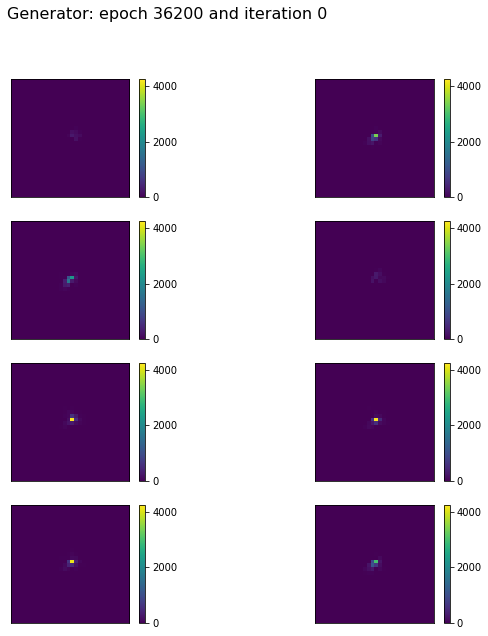

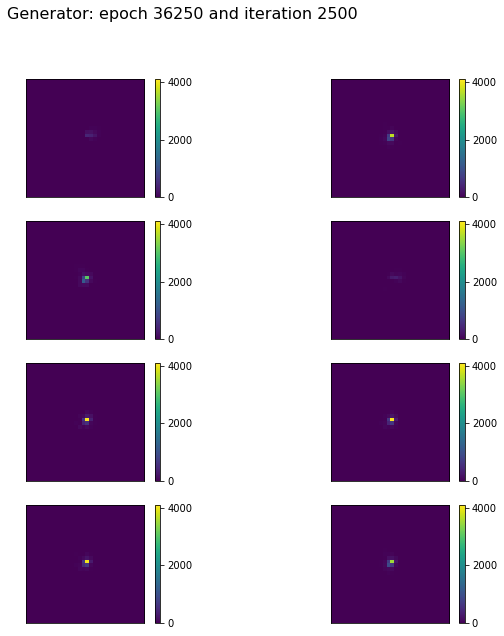

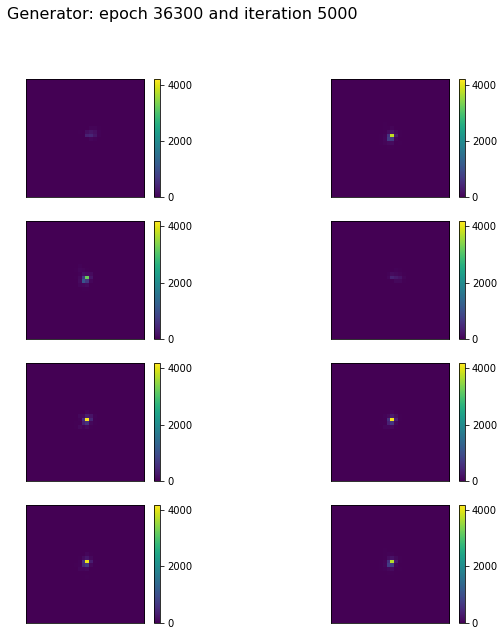

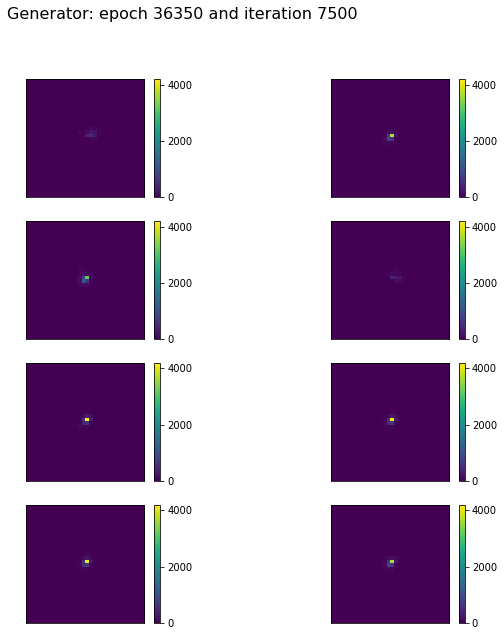

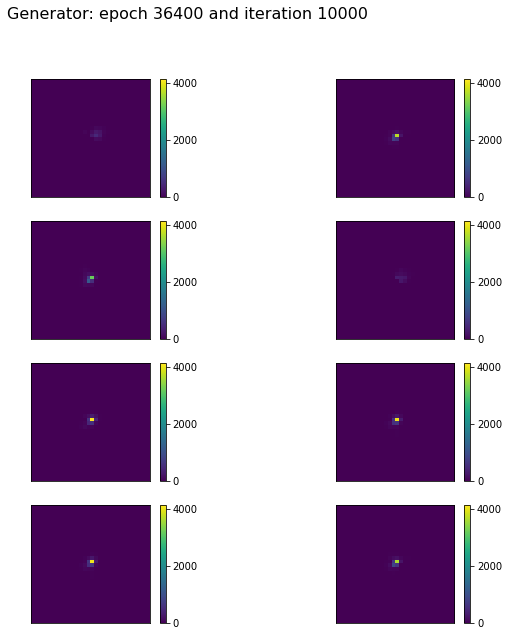

...

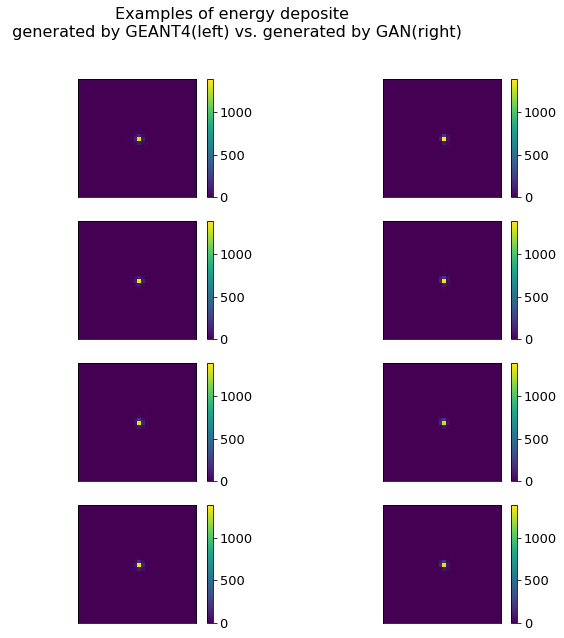

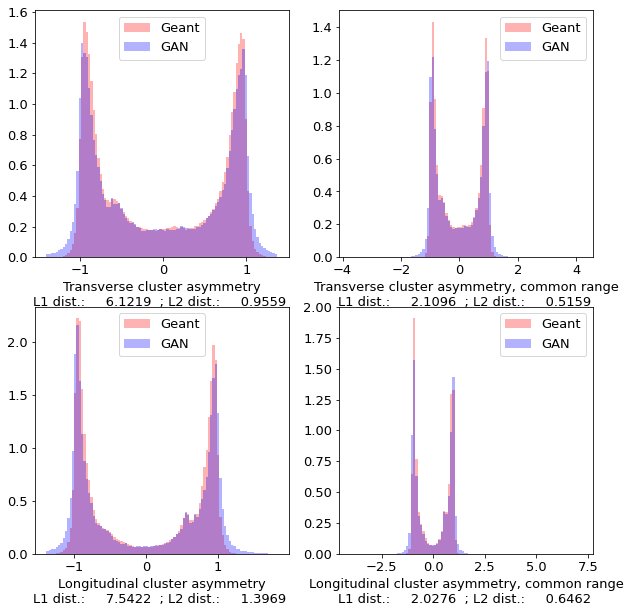

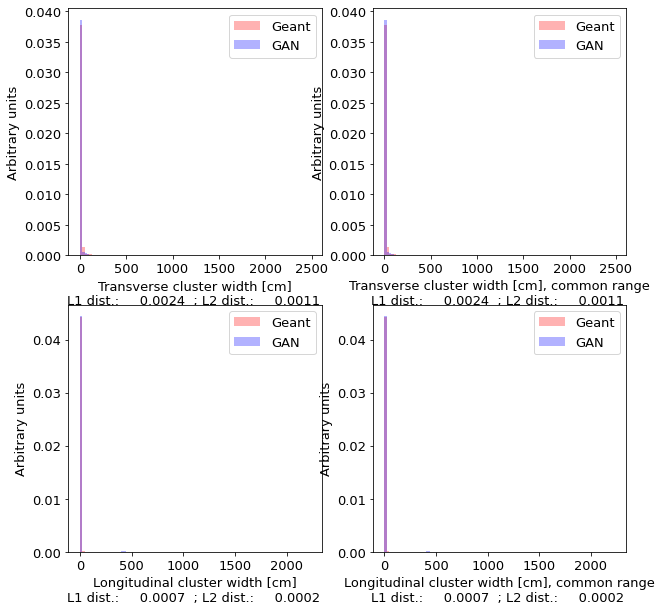

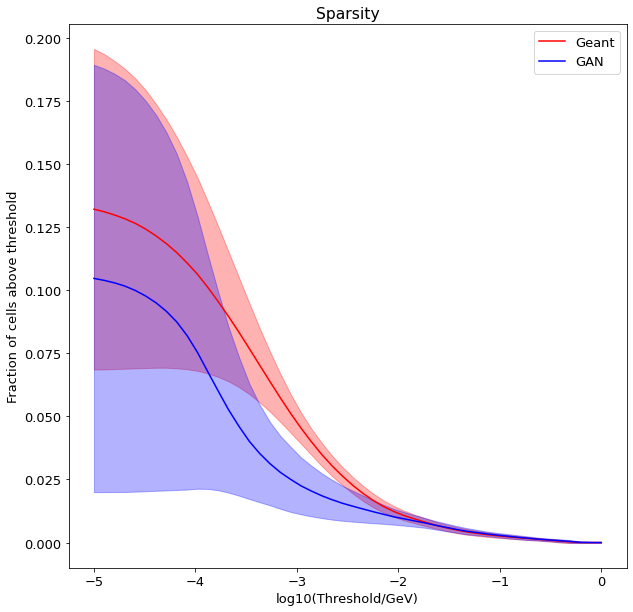

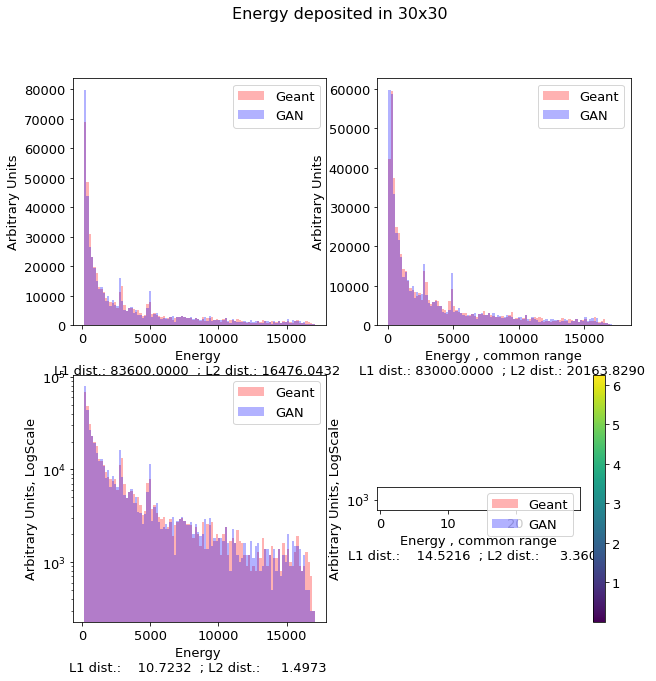

mkdir: cannot create directory ‘/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition’: File exists
'resources/computed/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200_1.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200_1.pdf'
'resources/computed/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200_2.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200_2.pdf'
'resources/computed/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200.pdf'
'resources/computed/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200_stats_generated_1.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition/joined_b100_1_and_v4_34k10_cLinearDeep_WGAN_10200_stats_generated_1.pdf'
'resources/computed/joined_b100_1_and_v4_34k10_cLinearDeep_

In [12]:
import os
gpWeight = 10 # gradient penalty weight; somehow 0.1 is nice, 1 is so so, 10 is bad, 0.01 is vanishing


for testCase in testPlan :
  print()
  batch_size = int(testCase[0])  # Batch size during training
  num_epochs = testCase[1]  # 5 for example, need much more for learning
  ganFile = resultingName 
  print(ganFile + ' is found?     ' + str(os.path.isfile(ganFile + '.pth')))
  pdfFile = resultingName + '_' + str(batch_size)
  itersPerEpoch = len(dataSet) / batch_size
  print(pdfFile + '\t' + str(itersPerEpoch))
  debugg = trainer.Debugg(itersPerEpoch, itersPerEpoch * 50, min(num_epochs, 100)) #plot set to big number to force trainer to plot generated images only once per epoch
  

  problem = domain.parameters.ProblemSize(nz, ngf, nc, batch_size, imgSize, conditionSize)
  
  dataLoader = torch.utils.data.DataLoader(dataSet, batch_size=batch_size, shuffle=True, num_workers=1)
  dataRetriever = training.losses.DataRetriever(isDcgan)
  lossCalculator = training.losses.GanLoss(device, problem, nn.BCELoss()) if type == mygan.GANS.GAN \
        else (training.losses.WganLoss if type == mygan.GANS.WGAN else training.losses.CramerEneryGanLoss)(problem, dataRetriever,
                                                                                                           training.losses.GradientPenalizer(gpWeight,True,ngpu > 0))
  #training phase
  netG.train(), netD.train()
  ganTrainer = trainer.Trainer(device, problem, lossCalculator, initOptimizer, lambda d: d[0], ganFile, debugg)

  ui = plotUi.PDFPlotUi(pdfFile)
  painter = painters.ECalPainter(ui)
  print("Starting Training Loop...")
  start = timer()
  dopt, gopt = ganTrainer.train(netD, netG, dataLoader, num_epochs, hyperParams, painter, 8)
    # painter.plotFake(netG.forward(torch.randn(128000, nz, 1, 1, device=device)), num_epochs, 0)
  end = timer()
  print('!!!!!!!!!!!!!!!!!! TIME ELAPSED : ' + str(end - start))
  
  ui.toView(lambda: painters.plotLosses(ganTrainer.G_losses, ganTrainer.D_losses))
  latest = min(num_epochs, 5000)
  ui.toView(lambda: painters.plotLosses(ganTrainer.G_losses[-latest:], ganTrainer.D_losses[-latest:]))
  if type != mygan.GANS.GAN:
      ui.toView(lambda: painters.plotGradPenalties(ganTrainer.ganLoss.gradientPenalizer.penalties, ganTrainer.ganLoss.gradientPenalizer.norms))

  ui.close()
  
  netG.eval(), netD.eval()
    
  shape = ecalDataPojo.response.shape
  print(shape)

  with torch.no_grad():
    tonnsOfNoise = torch.randn(shape[0], nz, device=device)
    generated = netG([tonnsOfNoise, condition.to(device)])
    fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

  ecalStatsPath = 'resources/computed/' + datasetName + '_stats' + '.pth'
  if not iogan.isFilePresent(ecalStatsPath): 
    ecalStats = OAF.optimized_analityc(ecalDataPojo, imgSize)
    torch.save(ecalStats, ecalStatsPath)
  else :
    print('Found calculated stats ' + ecalStatsPath)
    ecalStats = OAF.EcalStats(torch.load(ecalStatsPath))
  est, fakeStats = OAF.runAnalytics('/' + pdfFile, ecalDataPojo, fakeData, ecalStats, plotShape=False)

  plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
  plt.colorbar()
  plt.show()
  
  #finally we want to save our results to mounted GoogleDrive
  %mkdir   '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition'
  %cp -v $ganFile*  '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition'                                                                                                                                                                                                                   
                               
                                                                                                              
  
  



(80000, 30, 30)
stats processed 0
stats processed 10000
stats processed 20000
stats processed 30000
stats processed 40000
stats processed 50000
stats processed 60000
stats processed 70000


stats processed 0
stats processed 10000
stats processed 20000
stats processed 30000
stats processed 40000
stats processed 50000
stats processed 60000
stats processed 70000
Stats COMPUTED !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:47: RuntimeWarning:

divide by zero encountered in log10



ASSYMETRY plotted !!!
WIDTH plotted !!!
SPARSITY plotted !!!
ENERGY plotted !!!
Gonna plot SHAPE !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 16 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 14 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 12 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 10 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 8 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 6 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 4 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 2 !!!
PLOTUI is gonna get closed now!!!


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: UserWarning:

Attempted to set non-positive top ylim on a log-scaled axis.
Invalid limit will be ignored.



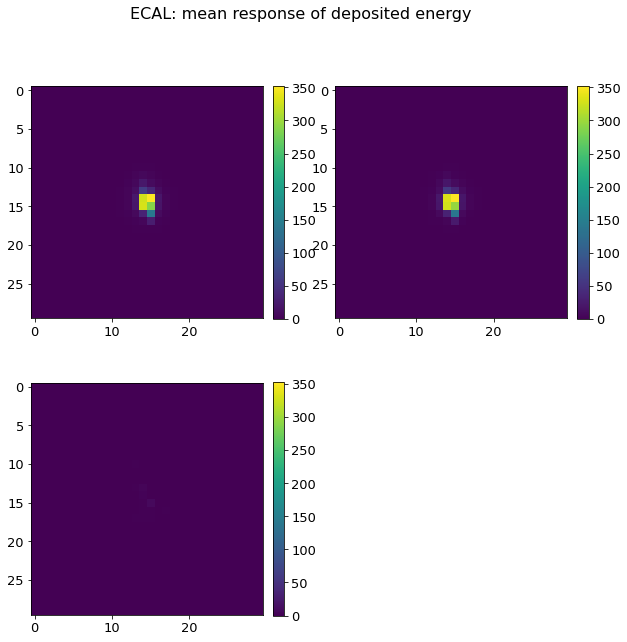

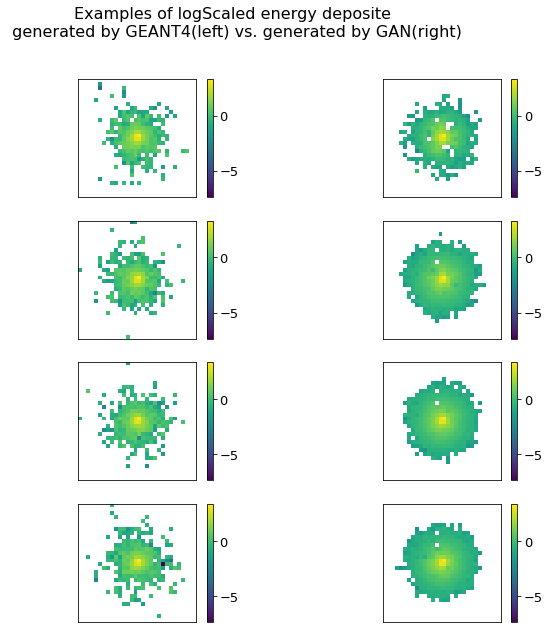

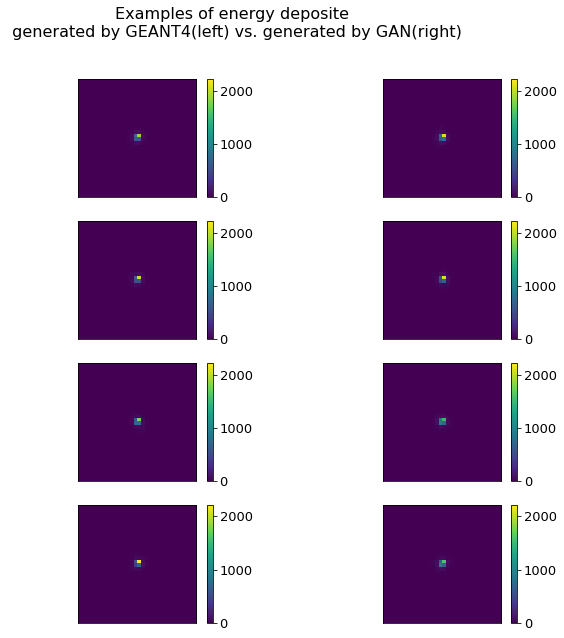

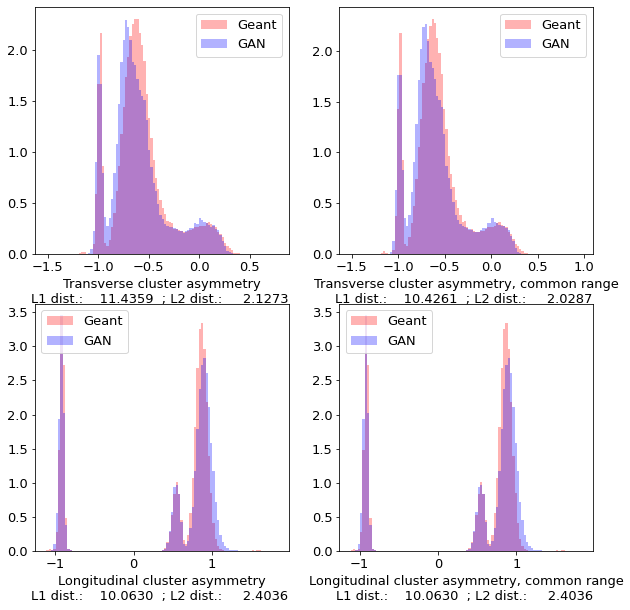

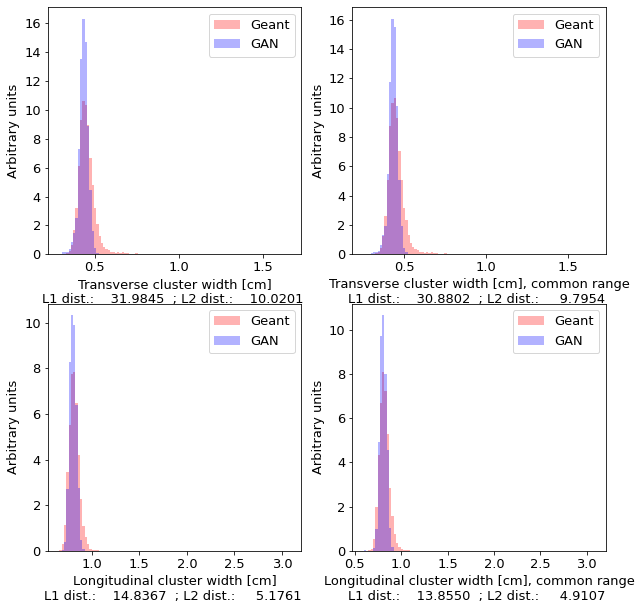

...

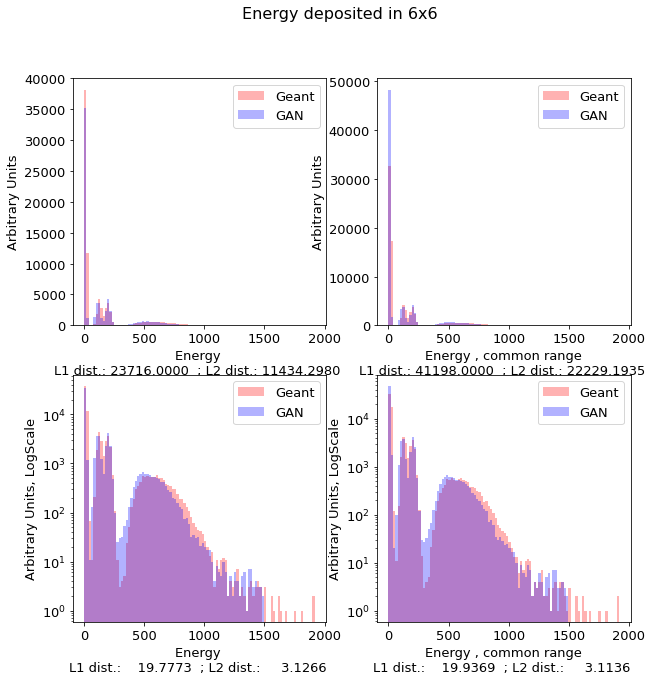

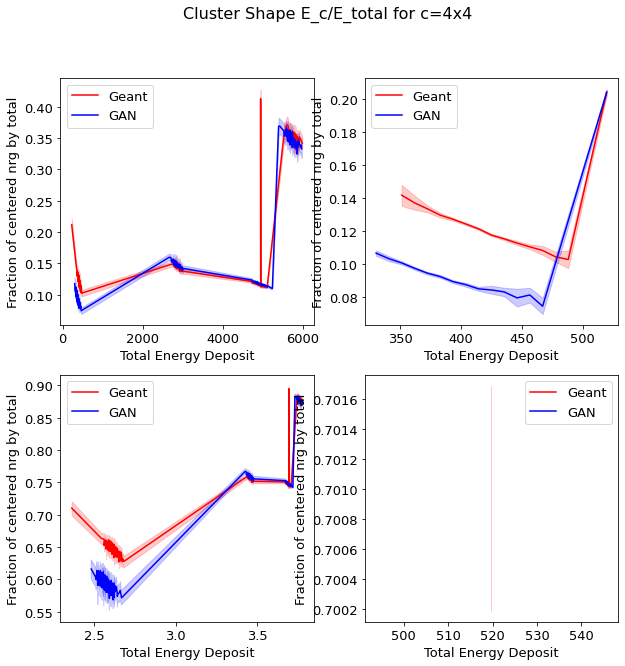

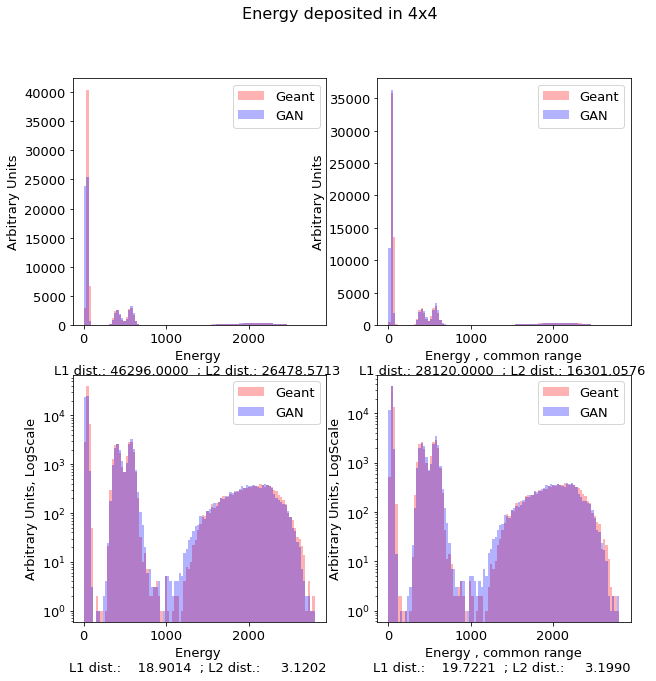

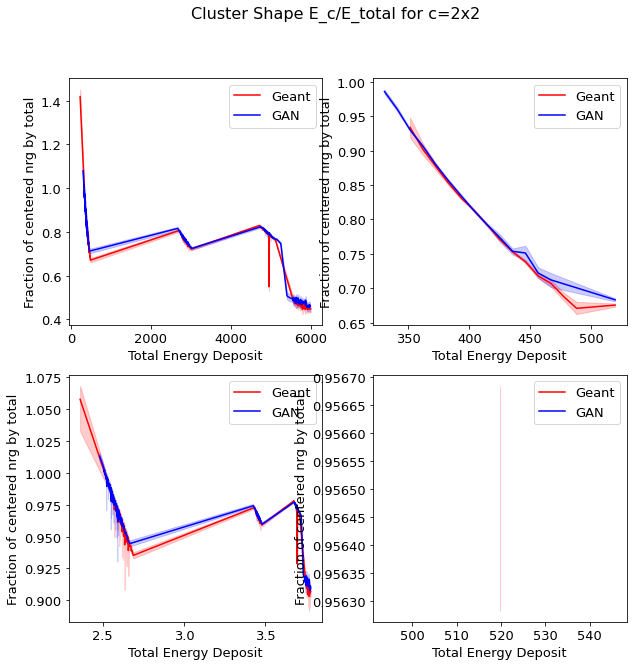

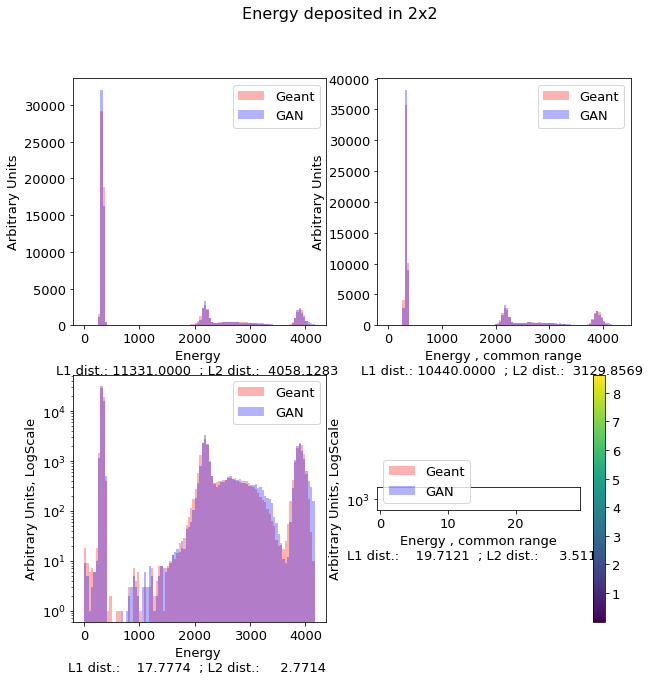

mkdir: cannot create directory ‘/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_14_multicondition’: File exists
'resources/computed/joined_v4_2k50_345k10_cLinearDeep_WGAN_1600.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_14_multicondition/joined_v4_2k50_345k10_cLinearDeep_WGAN_1600.pdf'
'resources/computed/joined_v4_2k50_345k10_cLinearDeep_WGAN_1600_stats_generated.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_14_multicondition/joined_v4_2k50_345k10_cLinearDeep_WGAN_1600_stats_generated.pdf'
'resources/computed/joined_v4_2k50_345k10_cLinearDeep_WGAN_8000.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_14_multicondition/joined_v4_2k50_345k10_cLinearDeep_WGAN_8000.pdf'
'resources/computed/joined_v4_2k50_345k10_cLinearDeep_WGAN_8000_stats_generated_1.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_14_multicondition/joined_v4_2k50_345k10_cLinearDeep_WGAN_8000_stats_generated_1.pdf'
'resources/computed/joined_v4_2k50_345k10_cLinearDeep_WGAN_8000_stats_generated.pdf

In [32]:
netG.eval(), netD.eval()
    
shape = ecalDataPojo.response.shape
print(shape)

with torch.no_grad():
  tonnsOfNoise = torch.randn(shape[0], nz, device=device)
  generated = netG([tonnsOfNoise, condition.to(device)])
  fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

ecalStatsPath = 'resources/computed/' + datasetName + '_stats' + '.pth'
if not iogan.isFilePresent(ecalStatsPath): 
  ecalStats = OAF.optimized_analityc(ecalDataPojo, imgSize)
  torch.save(ecalStats, ecalStatsPath)
else :
  print('Found calculated stats ' + ecalStatsPath)
  ecalStats = OAF.EcalStats(torch.load(ecalStatsPath))
est, fakeStats = OAF.runAnalytics('/' + pdfFile, ecalDataPojo, fakeData, ecalStats, plotShape=True)

plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
plt.colorbar()
plt.show()
  
  #finally we want to save our results to mounted GoogleDrive
%mkdir   '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_14_multicondition'
%cp -v $ganFile*  '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_14_multicondition'  

mean of conditions is = tensor([[  1.2324,   6.0352,  -2.5395, -12.4863,  31.5213]])
stdd of conditions is = tensor([0., 0., 0., 0., 0.])
(10000, 30, 30)
stats processed 0


stats processed 0
Stats COMPUTED !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:47: RuntimeWarning:

divide by zero encountered in log10



ASSYMETRY plotted !!!
WIDTH plotted !!!
SPARSITY plotted !!!
ENERGY plotted !!!
Gonna plot SHAPE !!!
SHAPE plotted crop = 16 !!!
SHAPE plotted crop = 14 !!!
SHAPE plotted crop = 12 !!!
SHAPE plotted crop = 10 !!!
SHAPE plotted crop = 8 !!!
SHAPE plotted crop = 6 !!!


/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 4 !!!


/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 2 !!!
PLOTUI is gonna get closed now!!!


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: UserWarning:

Attempted to set non-positive top ylim on a log-scaled axis.
Invalid limit will be ignored.



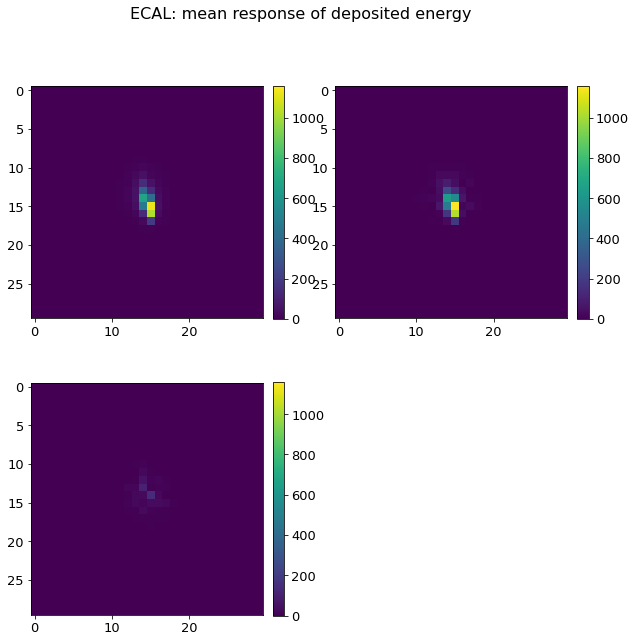

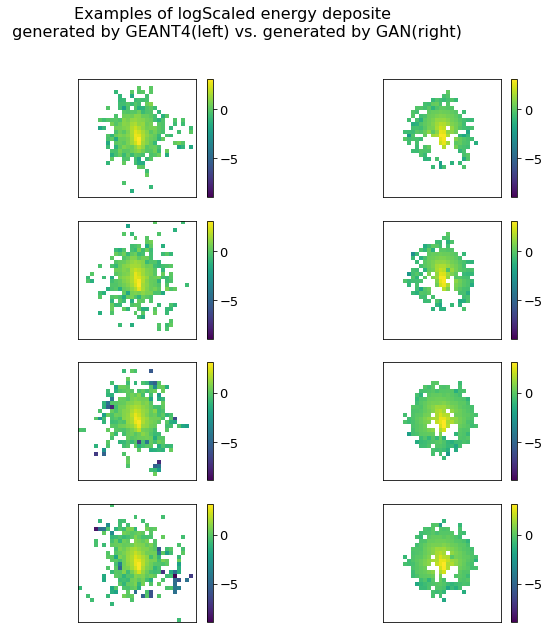

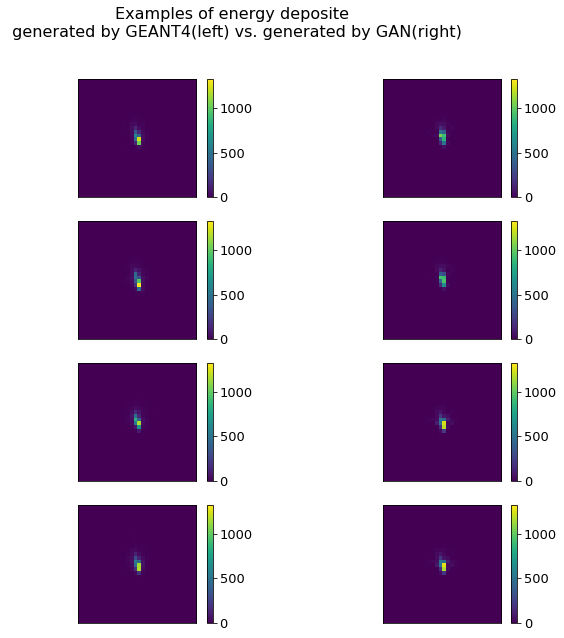

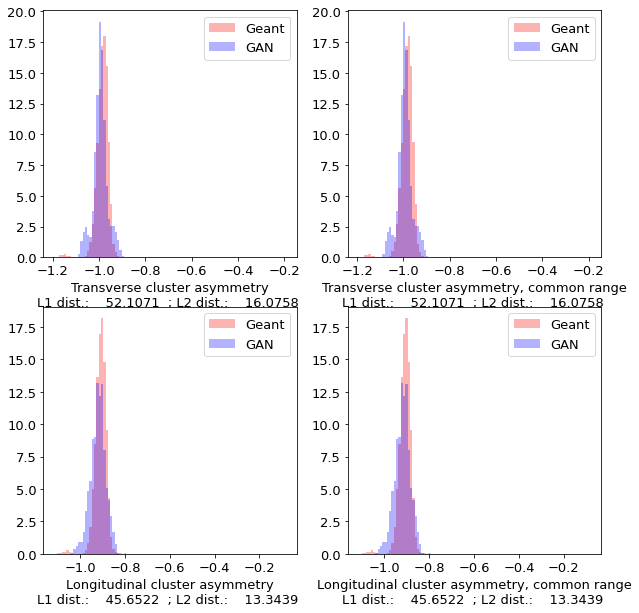

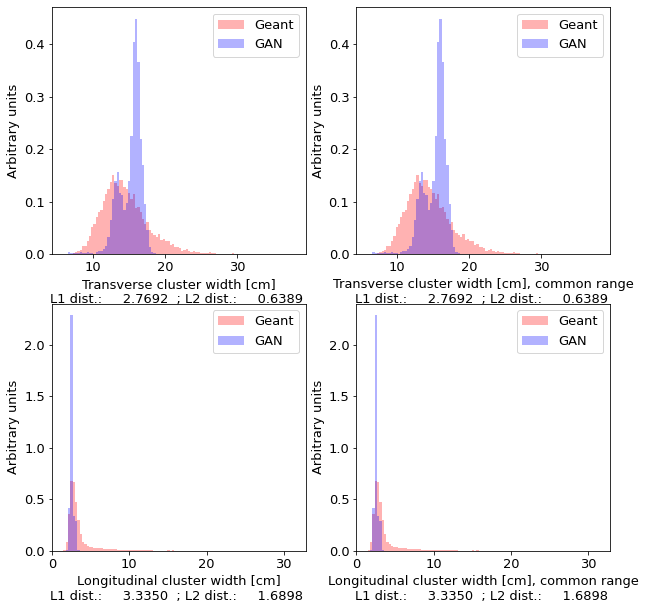

...

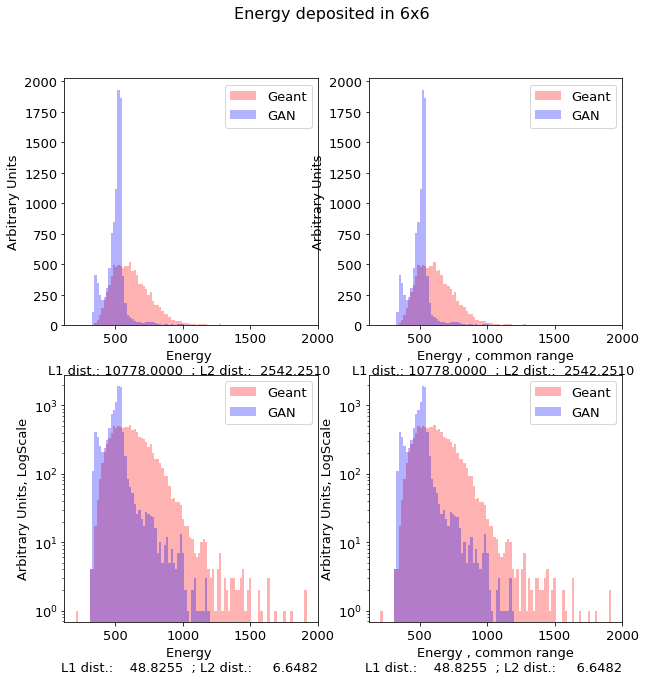

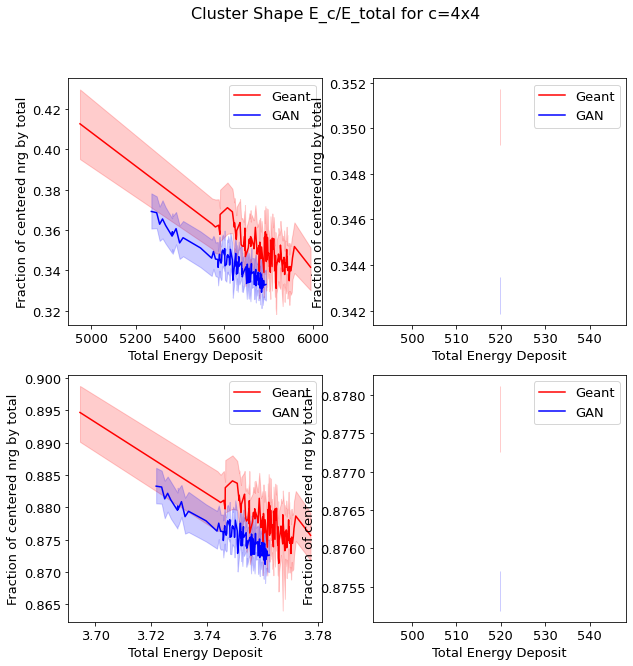

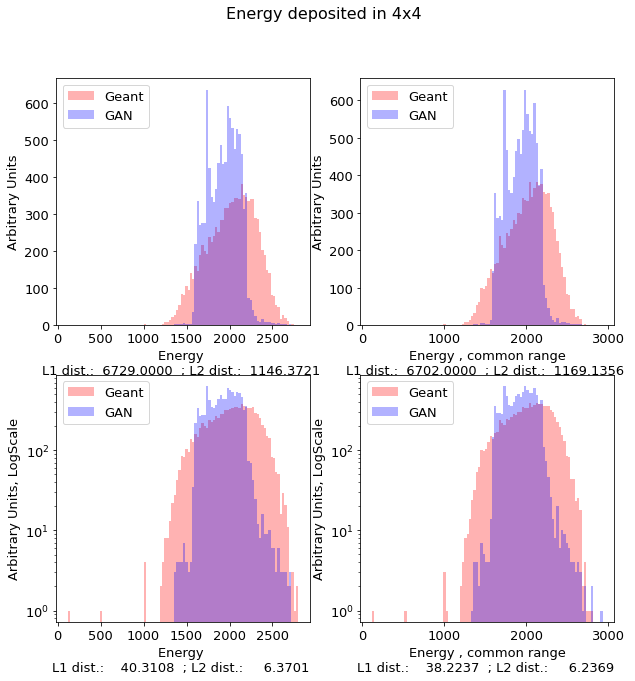

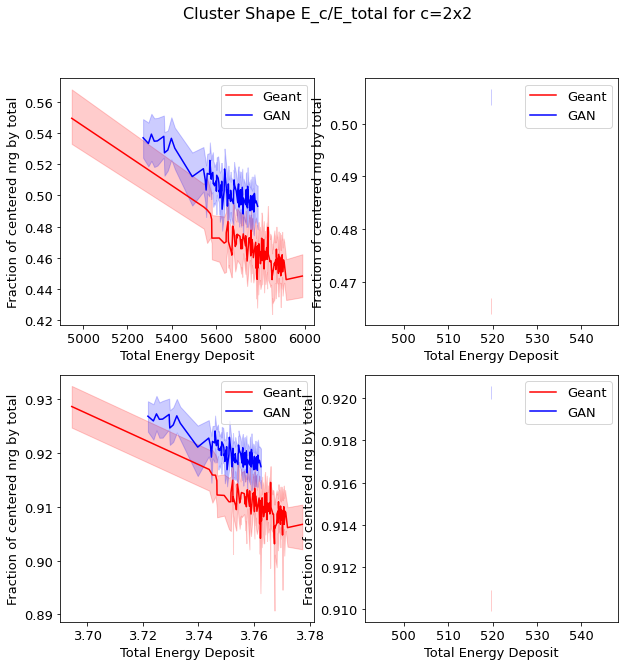

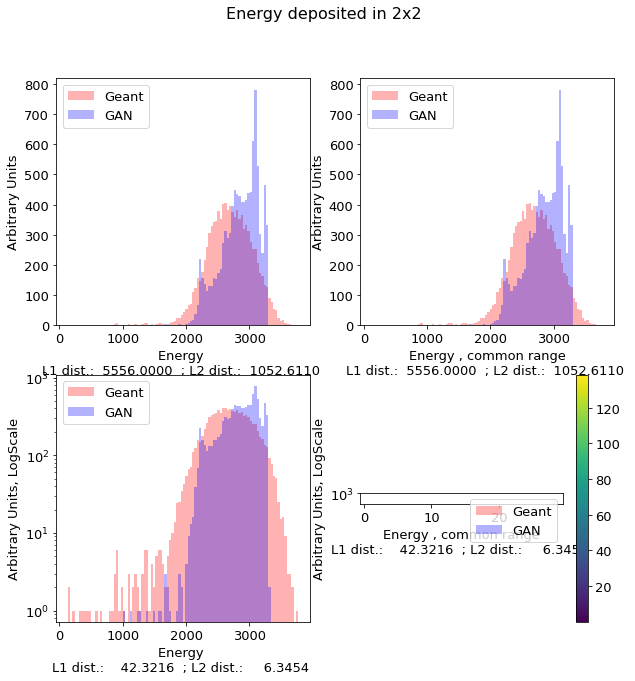

mkdir: cannot create directory ‘/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition’: File exists
'resources/computed/caloGAN_v4_case5_10K_cLinearDeep_WGAN_stats_generated.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition/caloGAN_v4_case5_10K_cLinearDeep_WGAN_stats_generated.pdf'
mean of conditions is = tensor([[-1.6379,  2.2077,  1.7578, -2.4005, 16.6359]])
stdd of conditions is = tensor([0., 0., 0., 0., 0.])
(10000, 30, 30)
stats processed 0


stats processed 0
Stats COMPUTED !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:47: RuntimeWarning:

divide by zero encountered in log10



ASSYMETRY plotted !!!
WIDTH plotted !!!
SPARSITY plotted !!!
ENERGY plotted !!!
Gonna plot SHAPE !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10



SHAPE plotted crop = 16 !!!
SHAPE plotted crop = 14 !!!
SHAPE plotted crop = 12 !!!
SHAPE plotted crop = 10 !!!
SHAPE plotted crop = 8 !!!
SHAPE plotted crop = 6 !!!


/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 4 !!!


/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 2 !!!
PLOTUI is gonna get closed now!!!


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: UserWarning:

Attempted to set non-positive top ylim on a log-scaled axis.
Invalid limit will be ignored.



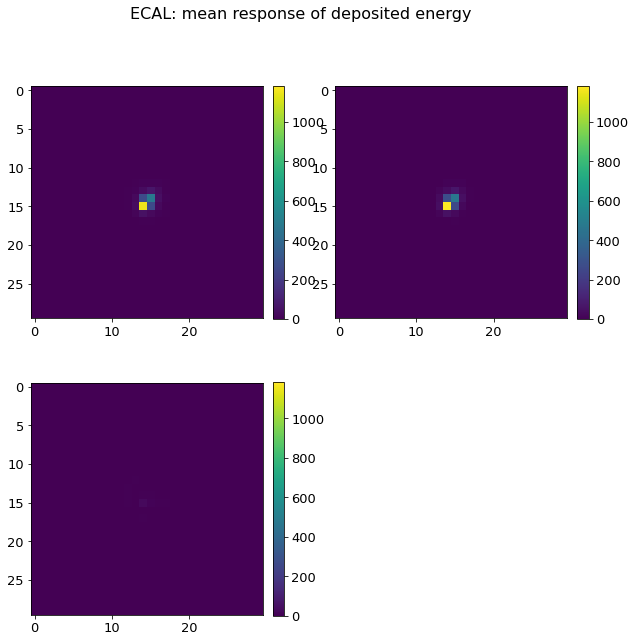

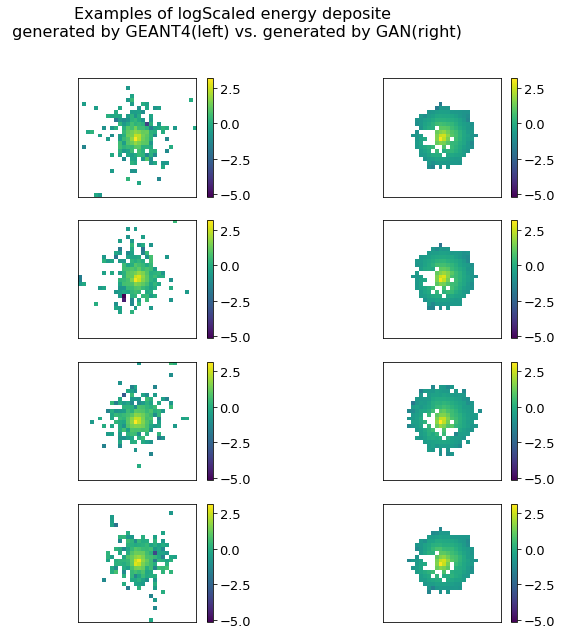

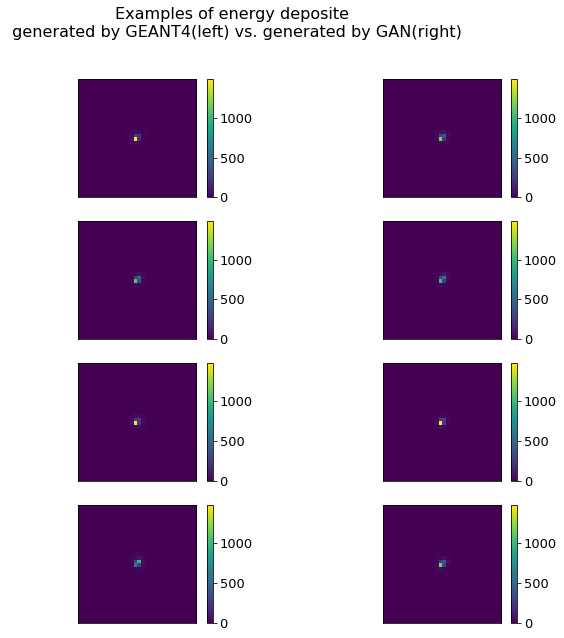

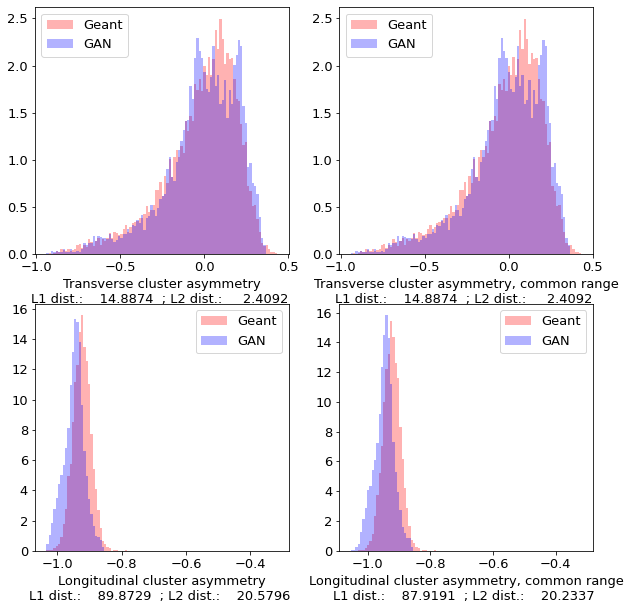

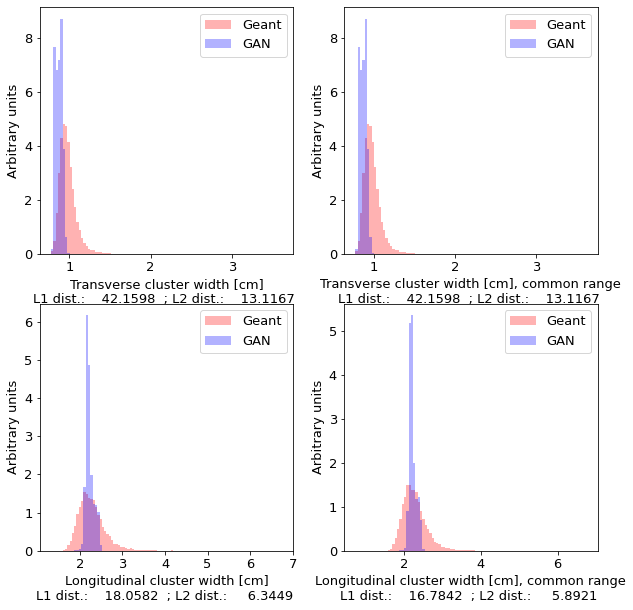

...

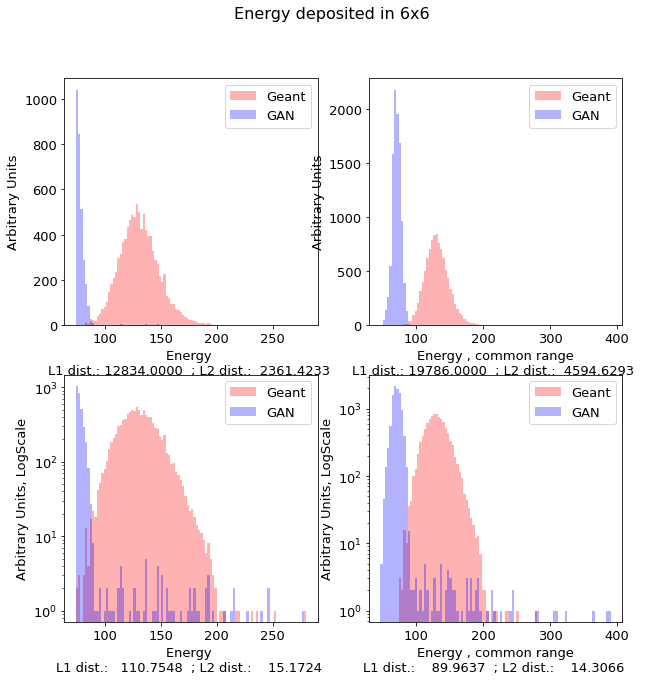

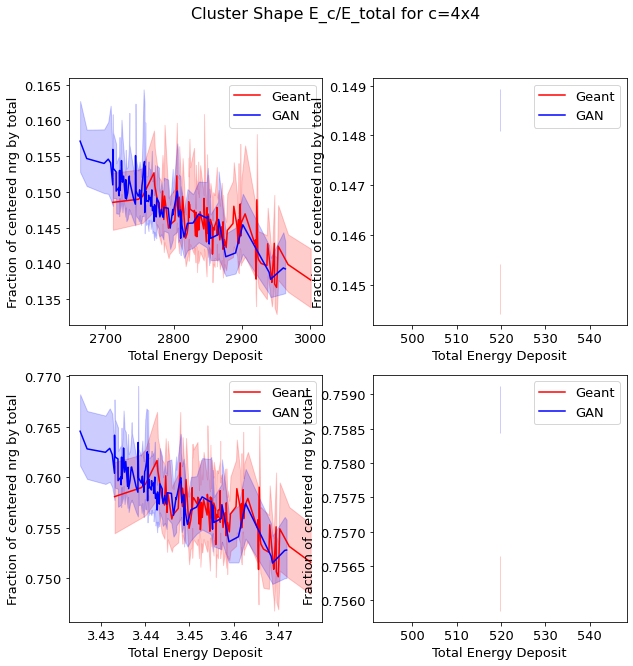

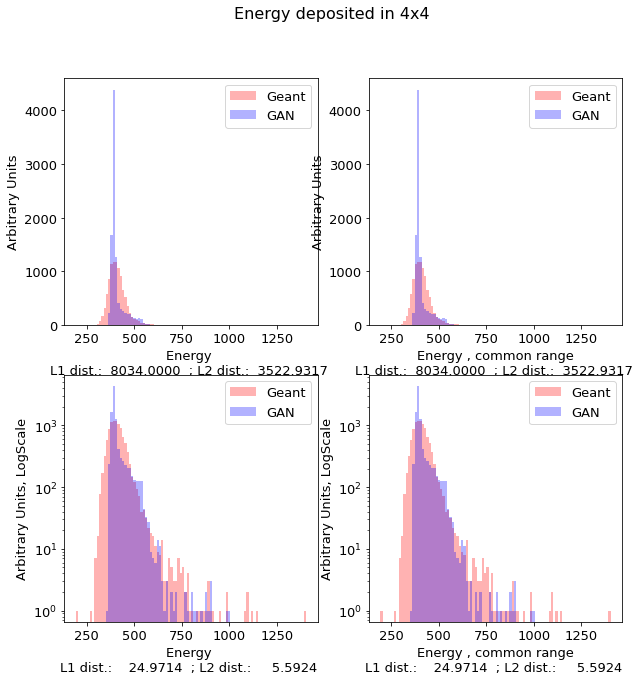

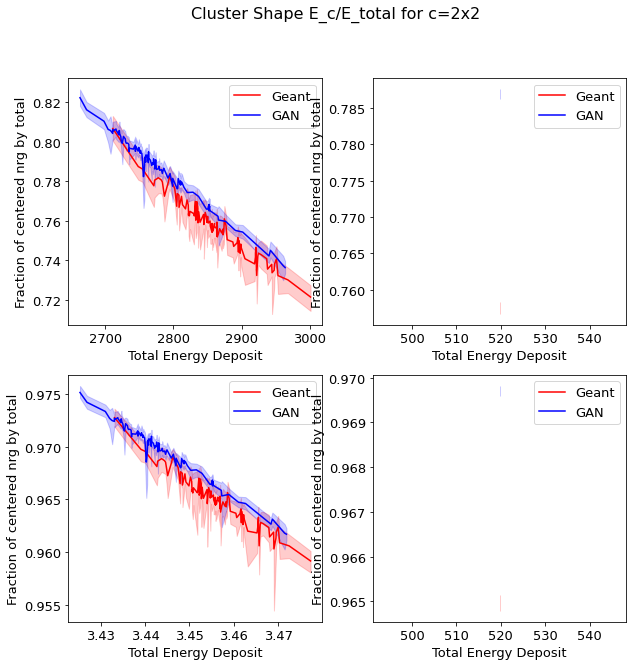

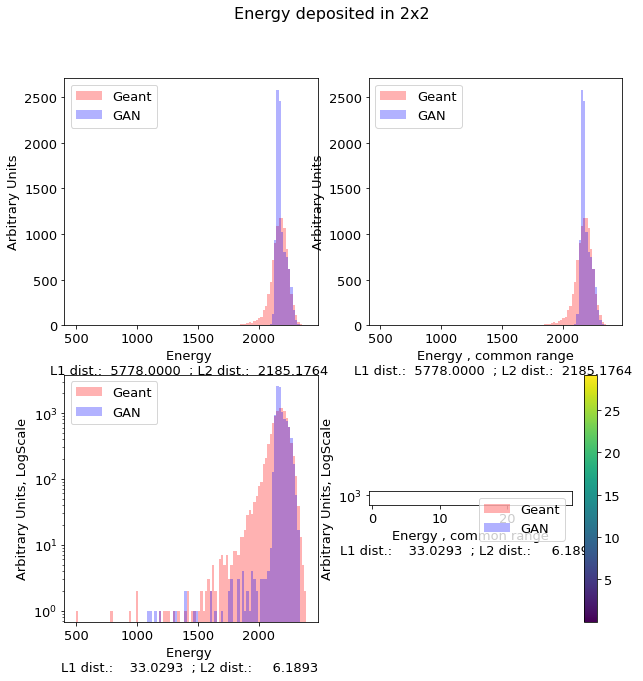

mkdir: cannot create directory ‘/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition’: File exists
'resources/computed/caloGAN_v4_case4_10K_cLinearDeep_WGAN_stats_generated.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition/caloGAN_v4_case4_10K_cLinearDeep_WGAN_stats_generated.pdf'
mean of conditions is = tensor([[ 0.9024, -0.4771, -1.5986,  0.8095, 29.0447]])
stdd of conditions is = tensor([0., 0., 0., 0., 0.])
(10000, 30, 30)
stats processed 0


stats processed 0
Stats COMPUTED !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:47: RuntimeWarning:

divide by zero encountered in log10



ASSYMETRY plotted !!!
WIDTH plotted !!!
SPARSITY plotted !!!
ENERGY plotted !!!
Gonna plot SHAPE !!!
SHAPE plotted crop = 16 !!!
SHAPE plotted crop = 14 !!!
SHAPE plotted crop = 12 !!!
SHAPE plotted crop = 10 !!!
SHAPE plotted crop = 8 !!!
SHAPE plotted crop = 6 !!!


/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 4 !!!


/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



SHAPE plotted crop = 2 !!!
PLOTUI is gonna get closed now!!!


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: UserWarning:

Attempted to set non-positive top ylim on a log-scaled axis.
Invalid limit will be ignored.



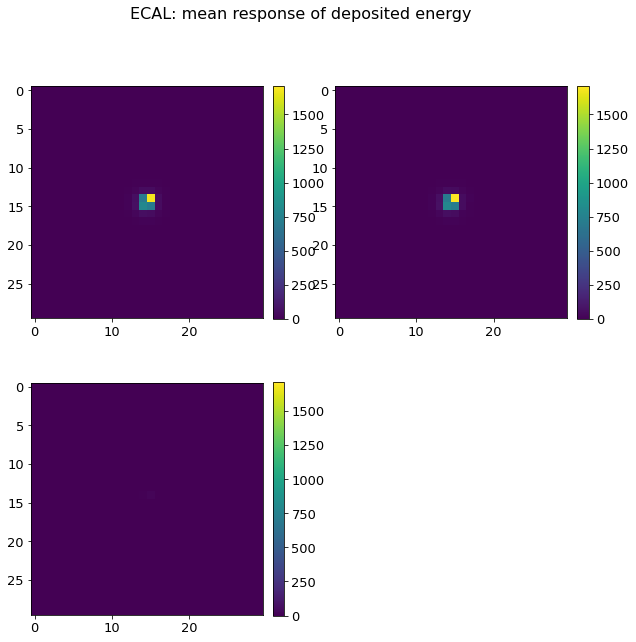

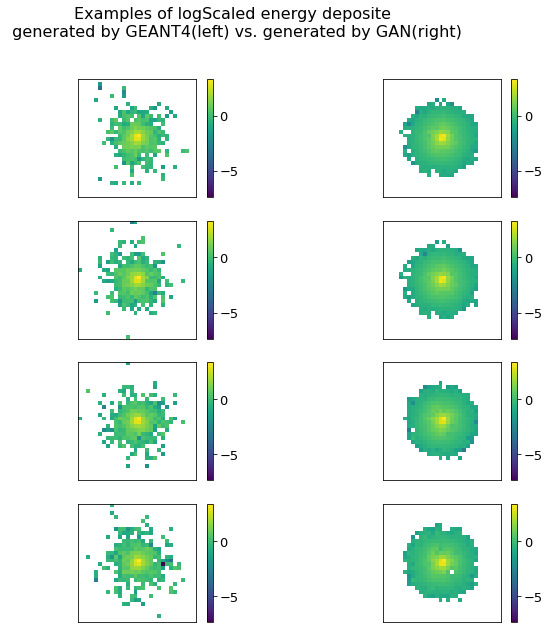

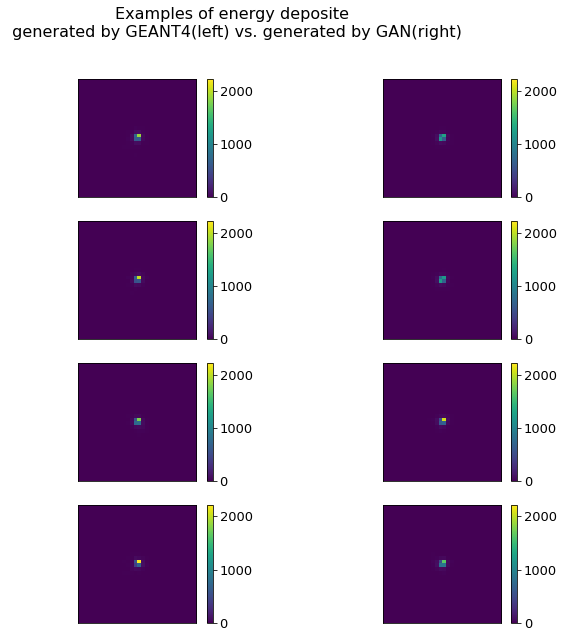

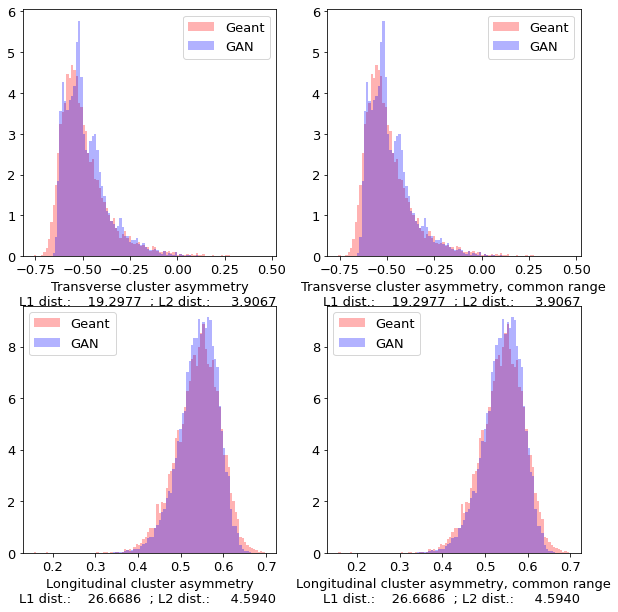

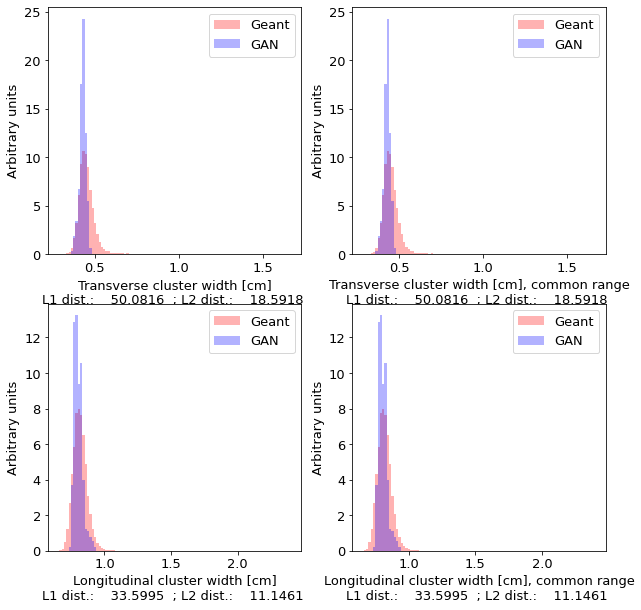

...

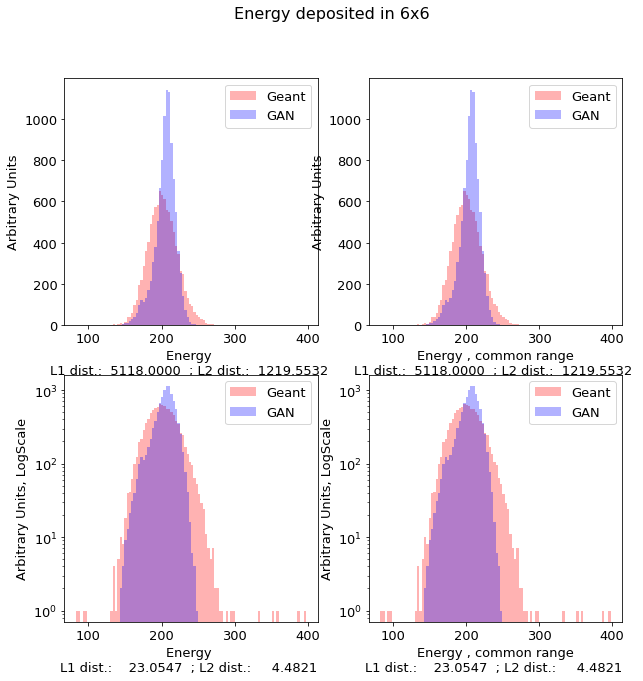

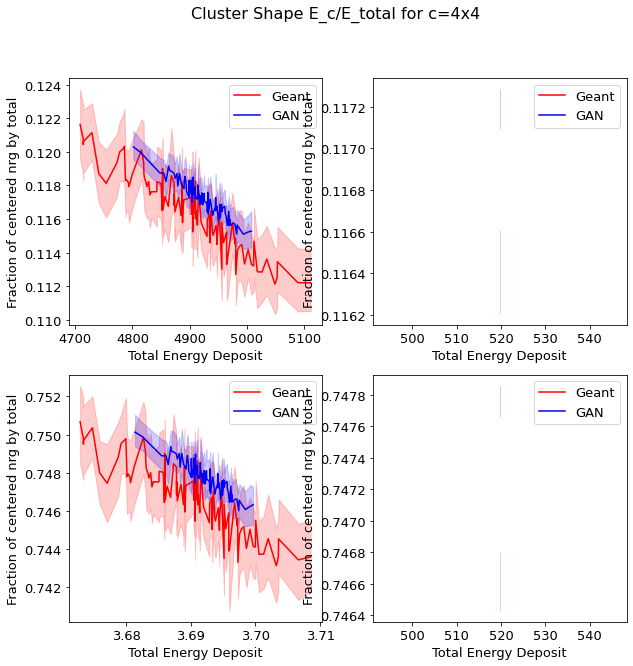

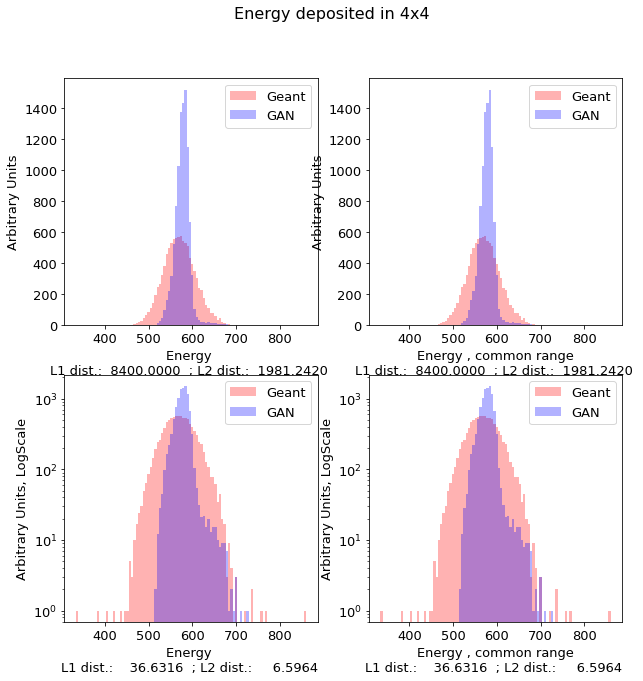

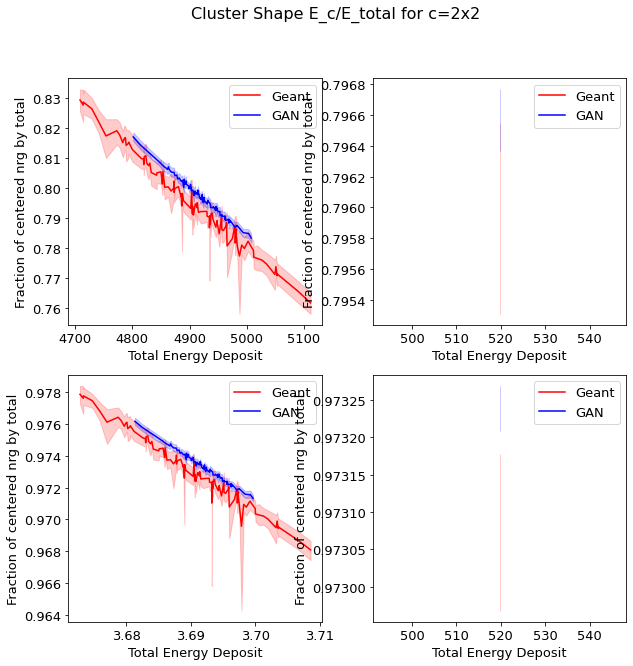

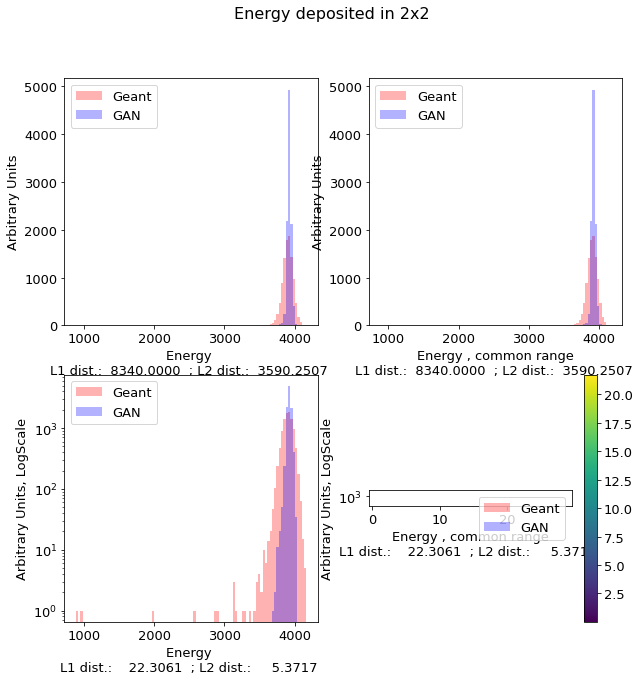

mkdir: cannot create directory ‘/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition’: File exists
'resources/computed/caloGAN_v4_case3_10K_cLinearDeep_WGAN_stats_generated.pdf' -> '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition/caloGAN_v4_case3_10K_cLinearDeep_WGAN_stats_generated.pdf'
mean of conditions is = tensor([[-1.0076, -0.9651,  0.1566,  0.1473,  2.4453]])
stdd of conditions is = tensor([0., 0., 0., 0., 0.])
(50000, 30, 30)
stats processed 0
stats processed 10000
stats processed 20000
stats processed 30000
stats processed 40000


stats processed 0
stats processed 10000
stats processed 20000
stats processed 30000
stats processed 40000
Stats COMPUTED !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:47: RuntimeWarning:

divide by zero encountered in log10



ASSYMETRY plotted !!!
WIDTH plotted !!!
SPARSITY plotted !!!
ENERGY plotted !!!
Gonna plot SHAPE !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 16 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 14 !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10



SHAPE plotted crop = 12 !!!


In [0]:
netG.eval(), netD.eval()

testSets = [ 'caloGAN_v4_case5_10K', 'caloGAN_v4_case4_10K', 'caloGAN_v4_case3_10K', 'caloGAN_v4_case2_50K' ]
for testDatasetName in testSets :
  edtestraw = np.load('/ecal/My Drive/ecal/%s.npz' % testDatasetName)
  edtest = domain.ecaldata.dictToEcalData(edtestraw, False)

  condtest = caloreg.buildConditionsBySample(edtest, False)
  mc = torch.mean(condtest, 0, True)
  ms = torch.std(condtest, 0, True)
  print('mean of conditions is = {}'.format(mc))
  print('stdd of conditions is = {}'.format(ms))

#here, fixed scales we need
  mc = torch.tensor([[-7.6309e-03,  1.0880e-02, -6.7299e-02, -1.3534e-02,  2.0679e+01]])
  ms = torch.tensor([ 2.7297,  2.6777,  5.6315,  5.3907, 24.1372])
  condtest = (condtest - mc) / ms

  shape = edtest.response.shape
  print(shape)

  with torch.no_grad():
    tonnsOfNoise = torch.randn(shape[0], nz, device=device)
    generated = netG([tonnsOfNoise, condtest.to(device)])
    fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), edtest.momentum, edtest.point)

  ecalStatsPath = 'resources/computed/' + testDatasetName + '_stats' + '.pth'
  testResultingName = 'resources/computed/%s_%s' % (testDatasetName, archVersion)
  if not iogan.isFilePresent(ecalStatsPath): 
    ecalStats = OAF.optimized_analityc(edtest, imgSize)
    torch.save(ecalStats, ecalStatsPath)
  else :
    print('Found calculated stats ' + ecalStatsPath)
    ecalStats = OAF.EcalStats(torch.load(ecalStatsPath))
  est, fakeStats = OAF.runAnalytics('/' + testResultingName, edtest, fakeData, ecalStats, plotShape=True)

  plt.imshow(abs(np.mean(edtest.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
  plt.colorbar()
  plt.show()
  
  #finally we want to save our results to mounted GoogleDrive
  %mkdir   '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition'
  %cp -v $testResultingName*  '/ecal/My Drive/ecal/C_JOIN_2345/cLinear_WGAN_16_multicondition'  

LLLLLLLLLLLLLL





resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN is found?     True
resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800	50.0
Starting Training Loop...
loaded precomputed gans
[1640/300][0/50]	Loss_D: -25140.7617	Loss_G: -593.1991	D(x): 58586.2266	D(G(z)): 7999.7476 / 593.1991
!!!!!! SAVING MODELS DONT BREAK EXECUTION !!!!!!
!!!!!! Models have been saved successfully !!!!!
[1641/300][0/50]	Loss_D: -18328.3477	Loss_G: 628.1342	D(x): 57760.7695	D(G(z)): 10526.1094 / -628.1342
[1642/300][0/50]	Loss_D: -24766.2559	Loss_G: -5605.2275	D(x): 48252.7461	D(G(z)): -742.0819 / 5605.2275
[1643/300][0/50]	Loss_D: -26106.2930	Loss_G: -3441.9919	D(x): 56128.8555	D(G(z)): 6030.5249 / 3441.9919
[1644/300][0/50]	Loss_D: -23999.1309	Loss_G: 687.7715	D(x): 59325.0039	D(G(z)): 8868.8086 / -687.7715
[1645/300][0/50]	Loss_D: -26680.6543	Loss_G: -5983.0317	D(x): 50603.5938	D(G(z)): 379.7106 / 5983.0317
[1646/300][0/50]	Loss_D: -26512.7402	Loss_G: -3414.3706	D(x): 52048.4258	D(G(z)): 1926.1

/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



!!!!!! SAVING MODELS DONT BREAK EXECUTION !!!!!!
!!!!!! Models have been saved successfully !!!!!
[1741/300][0/50]	Loss_D: -18430.5078	Loss_G: 10067.6230	D(x): 28486.6309	D(G(z)): -6869.3960 / -10067.6230
[1742/300][0/50]	Loss_D: -17772.2188	Loss_G: 5546.3574	D(x): 22593.5469	D(G(z)): -10836.0068 / -5546.3574
[1743/300][0/50]	Loss_D: -17845.4570	Loss_G: 4595.2075	D(x): 25035.8926	D(G(z)): -9815.0527 / -4595.2075
[1744/300][0/50]	Loss_D: -16294.6738	Loss_G: 10905.6914	D(x): 32265.0391	D(G(z)): -3871.5559 / -10905.6914
[1745/300][0/50]	Loss_D: -16381.9395	Loss_G: 11893.5400	D(x): 29921.4297	D(G(z)): -4802.9199 / -11893.5400
[1746/300][0/50]	Loss_D: -15400.6699	Loss_G: 5779.5249	D(x): 20291.7031	D(G(z)): -11765.5410 / -5779.5249
[1747/300][0/50]	Loss_D: -13766.8555	Loss_G: 10424.6602	D(x): 34402.2969	D(G(z)): -1800.8788 / -10424.6602
[1748/300][0/50]	Loss_D: -20866.8301	Loss_G: 4082.7698	D(x): 21766.4297	D(G(z)): -14242.4014 / -4082.7698
[1749/300][0/50]	Loss_D: -16385.6758	Loss_G: 10120.

/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/content/diving-deep-learning/plots/plotUi.py:44: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



mkdir: cannot create directory ‘/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN’: File exists
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_1.pdf' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_1.pdf'
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_2.pdf' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_2.pdf'
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_3.pdf' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_3.pdf'
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_4.pdf' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_4.pdf'
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_5.pdf' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_5.pdf'
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_6.

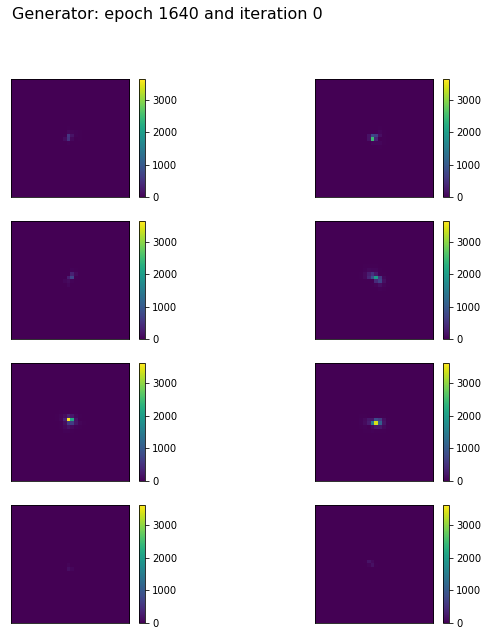

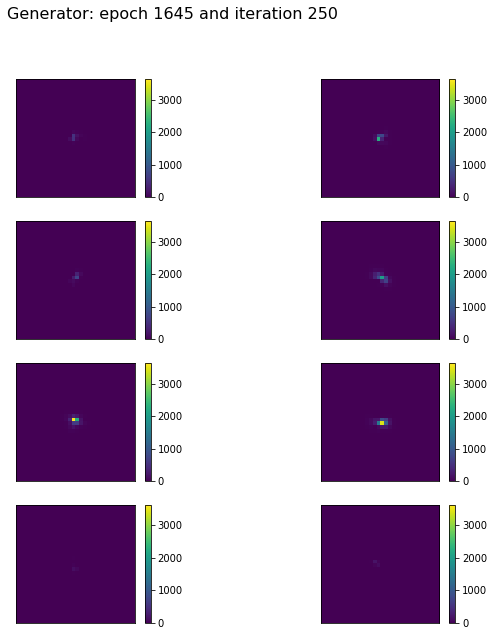

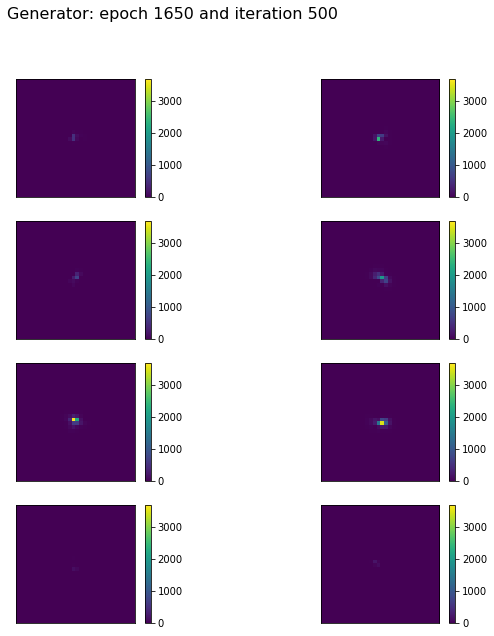

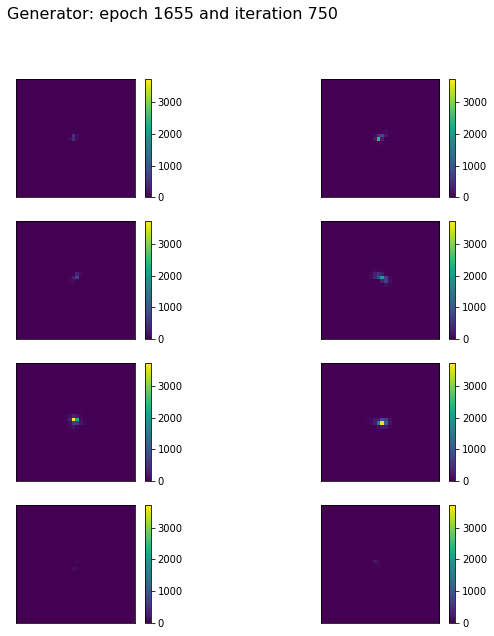

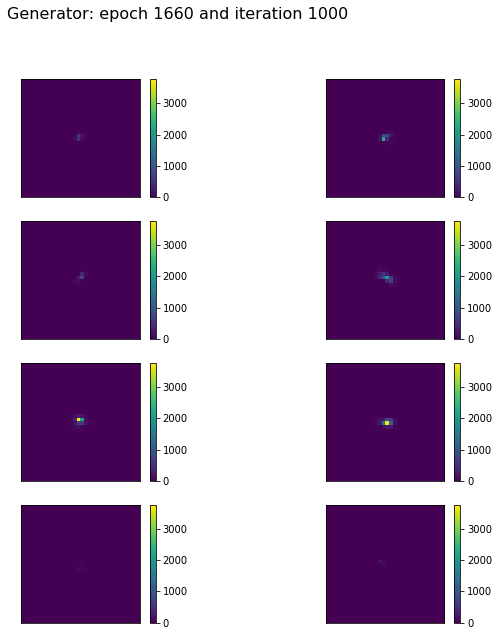

...

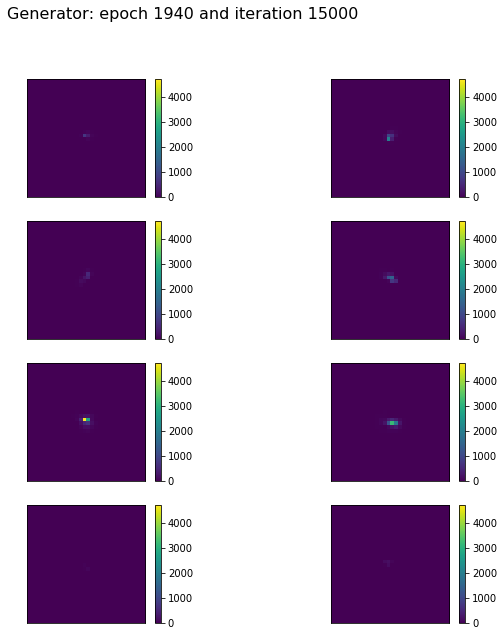

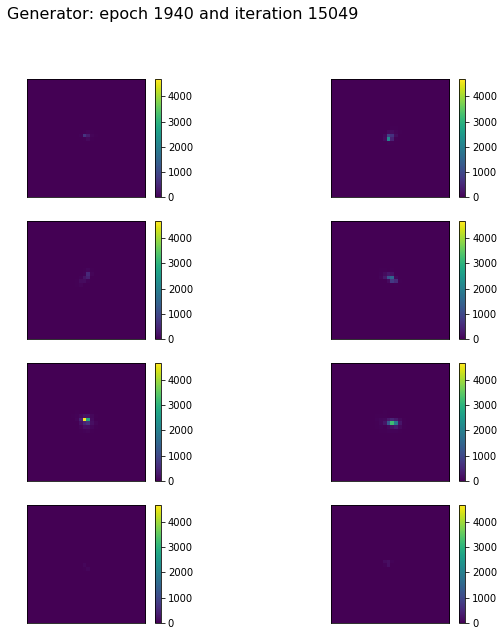

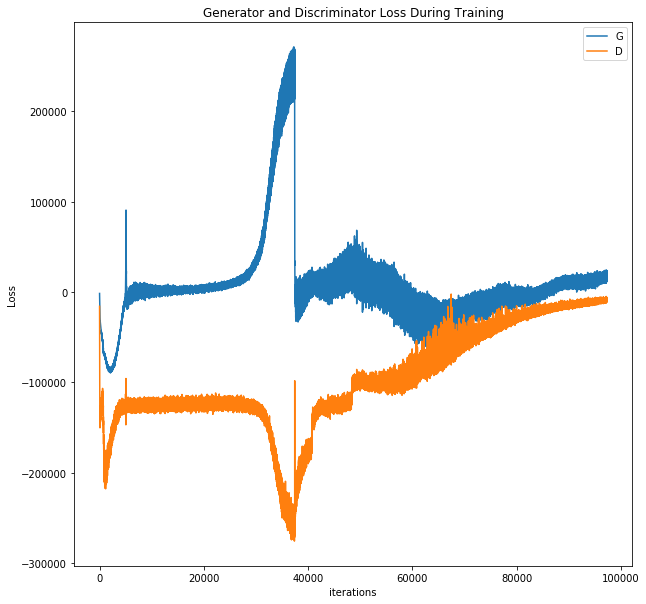

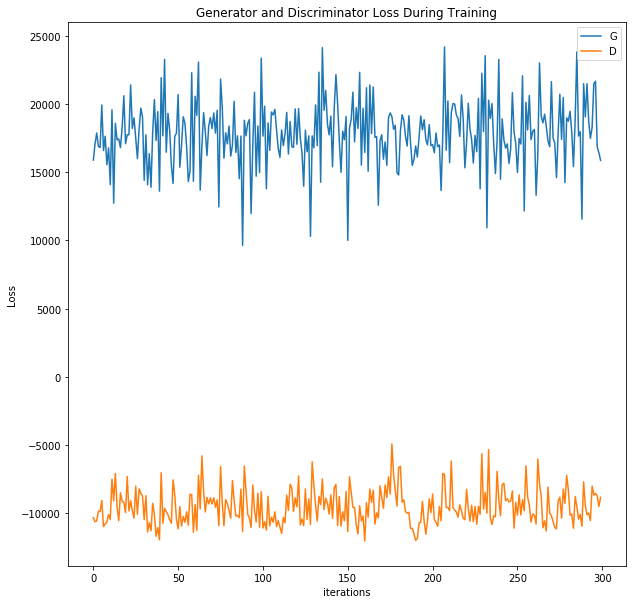

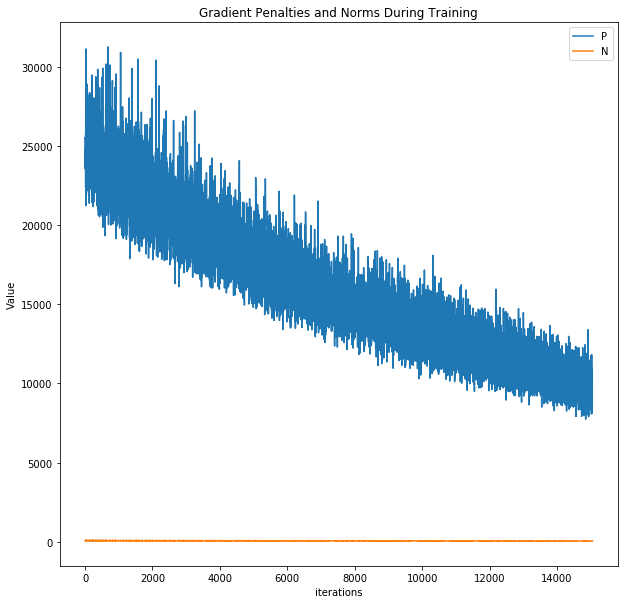

In [0]:
import os
gpWeight = 2 # gradient penalty weight; somehow 0.1 is nice, 1 is so so, 10 is bad, 0.01 is vanishing


for testCase in testPlan :
  print()
  batch_size = int(testCase[0])  # Batch size during training
  num_epochs = testCase[1]  # 5 for example, need much more for learning
  ganFile = resultingName 
  print(ganFile + ' is found?     ' + str(os.path.isfile(ganFile + '.pth')))
  pdfFile = resultingName + '_' + str(batch_size)
  itersPerEpoch = len(dataSet) / batch_size
  print(pdfFile + '\t' + str(itersPerEpoch))
  debugg = trainer.Debugg(itersPerEpoch, itersPerEpoch * 5, min(num_epochs, 20)) #plot set to big number to force trainer to plot generated images only once per epoch
  

  problem = domain.parameters.ProblemSize(nz, ngf, nc, batch_size, imgSize, conditionSize)
  
  dataLoader = torch.utils.data.DataLoader(dataSet, batch_size=batch_size, shuffle=True, num_workers=1)
  dataRetriever = training.losses.DataRetriever(isDcgan)
  lossCalculator = training.losses.GanLoss(device, problem, nn.BCELoss()) if type == mygan.GANS.GAN \
        else (training.losses.WganLoss if type == mygan.GANS.WGAN else training.losses.CramerEneryGanLoss)(problem, dataRetriever,
                                                                                                           training.losses.GradientPenalizer(gpWeight,True,ngpu > 0))
  #training phase
  netG.train(), netD.train()
  ganTrainer = trainer.Trainer(device, problem, lossCalculator, initOptimizer, lambda d: d[0], ganFile, debugg)

  ui = plotUi.PDFPlotUi(pdfFile)
  painter = painters.ECalPainter(ui)
  print("Starting Training Loop...")
  start = timer()
  dopt, gopt = ganTrainer.train(netD, netG, dataLoader, num_epochs, hyperParams, painter, 8)
    # painter.plotFake(netG.forward(torch.randn(128000, nz, 1, 1, device=device)), num_epochs, 0)
  end = timer()
  print('!!!!!!!!!!!!!!!!!! TIME ELAPSED : ' + str(end - start))
  
  ui.toView(lambda: painters.plotLosses(ganTrainer.G_losses, ganTrainer.D_losses))
  latest = min(num_epochs, 5000)
  ui.toView(lambda: painters.plotLosses(ganTrainer.G_losses[-latest:], ganTrainer.D_losses[-latest:]))
  if type != mygan.GANS.GAN:
      ui.toView(lambda: painters.plotGradPenalties(ganTrainer.ganLoss.gradientPenalizer.penalties, ganTrainer.ganLoss.gradientPenalizer.norms))

  ui.close()
  
                                                                                                                                                                                                                     
  #evaluation phase
  #netG.eval(), netD.eval()
    
  #shape = ecalDataPojo.response.shape
  #print(shape)

  #with torch.no_grad():
  #  tonnsOfNoise = torch.randn(shape[0], nz, device=device)
  #  generated = netG([tonnsOfNoise, condition.to(device)])
  #  fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

  #ecalStatsPath = 'resources/computed/' + datasetName + '_stats' + '.pth'
  #if not iogan.isFilePresent(ecalStatsPath): 
  #  ecalStats = OAF.optimized_analityc(ecalDataPojo, imgSize)
  #  torch.save(ecalStats, ecalStatsPath)
  #else :
  #  print('Found calculated stats ' + ecalStatsPath)
  #  ecalStats = OAF.EcalStats(torch.load(ecalStatsPath))
  #est, fakeStats = OAF.runAnalytics('/' + pdfFile, ecalDataPojo, fakeData, ecalStats)

  #plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
  #plt.colorbar()
  #plt.show()
  
  #finally we want to save our results to mounted GoogleDrive
  %mkdir   '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN'
  %cp -v $ganFile*  '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN'                                   
                                                                                                              
  
  



# MODEL VALIDAtion SeCtion


In [1]:
  #evaluation phase
netG.eval(), netD.eval()
    
shape = ecalDataPojo.response.shape
print(shape)

with torch.no_grad():
  tonnsOfNoise = torch.randn(shape[0], nz, device=device)
  generated = netG([tonnsOfNoise, condition.to(device)])
  fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

torch.save(fakeData, 'resources/computed/' + datasetName + '_fakes_8' + '.pth')

NameError: ignored

(490000, 30, 30)
stats processed 0
stats processed 10000
stats processed 20000
stats processed 30000
stats processed 40000
stats processed 50000
stats processed 60000
stats processed 70000
stats processed 80000
stats processed 90000
stats processed 100000
stats processed 110000
stats processed 120000
stats processed 130000
stats processed 140000
stats processed 150000
stats processed 160000
stats processed 170000
stats processed 180000
stats processed 190000
stats processed 200000
stats processed 210000
stats processed 220000
stats processed 230000
stats processed 240000
stats processed 250000
stats processed 260000
stats processed 270000
stats processed 280000
stats processed 290000
stats processed 300000
stats processed 310000
stats processed 320000
stats processed 330000
stats processed 340000
stats processed 350000
stats processed 360000
stats processed 370000
stats processed 380000
stats processed 390000
stats processed 400000
stats processed 410000
stats processed 420000
stats pr

/content/diving-deep-learning/analytics/plotAnalytics.py:47: RuntimeWarning:

divide by zero encountered in log10



ASSYMETRY plotted !!!
WIDTH plotted !!!
SPARSITY plotted !!!
ENERGY plotted !!!


/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

divide by zero encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning:

invalid value encountered in log10

/content/diving-deep-learning/analytics/plotAnalytics.py:200: RuntimeWarning

PLOTUI is gonna get closed now!!!


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: UserWarning:

Attempted to set non-positive top ylim on a log-scaled axis.
Invalid limit will be ignored.



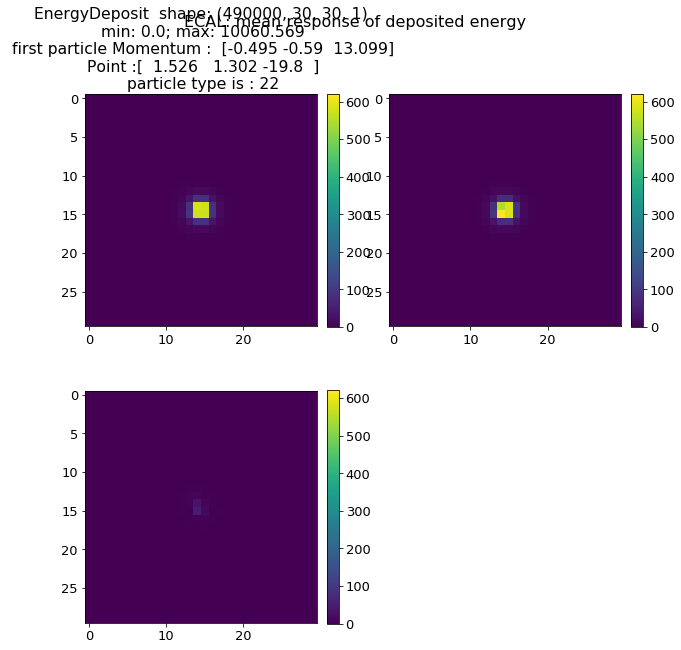

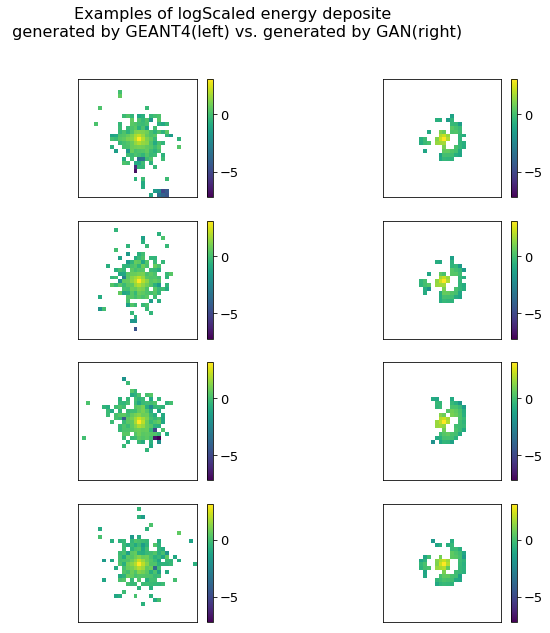

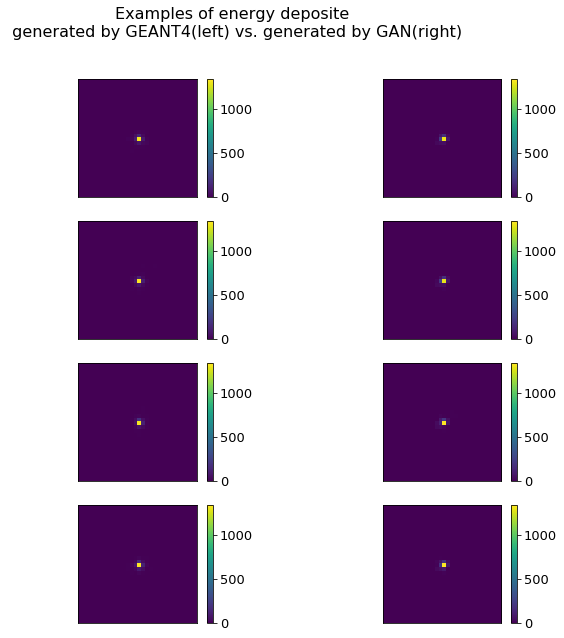

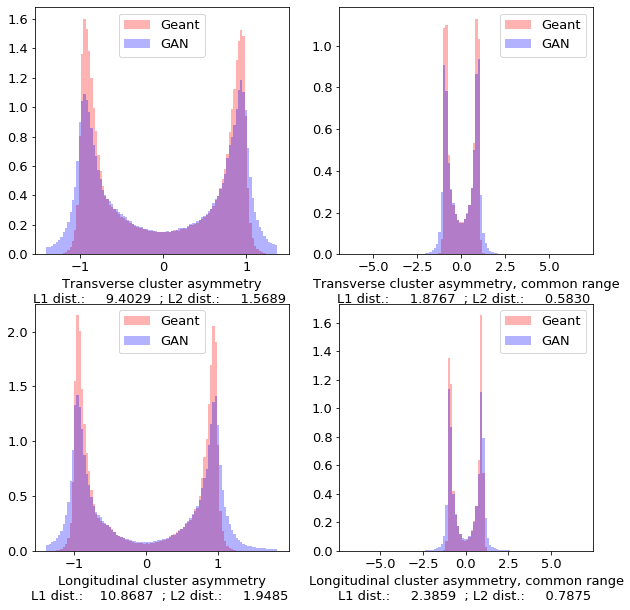

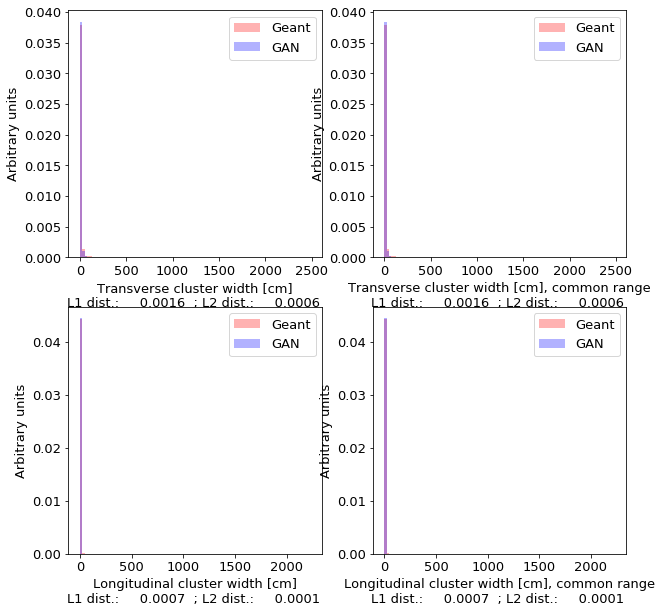

...

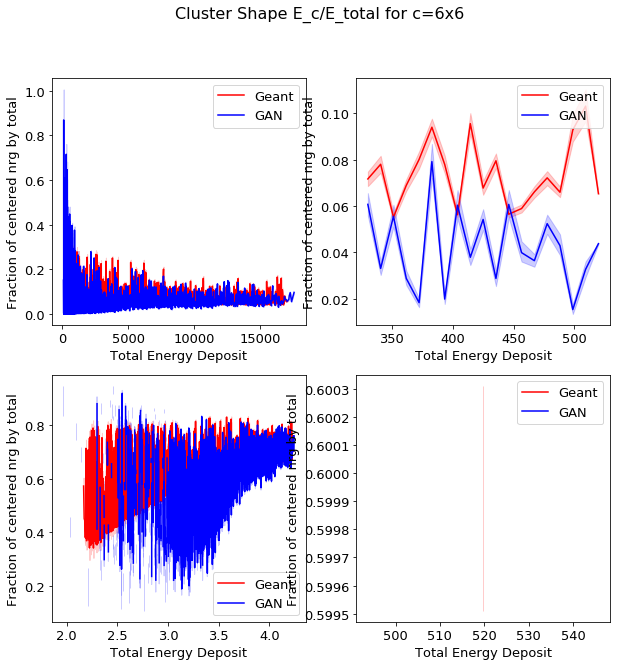

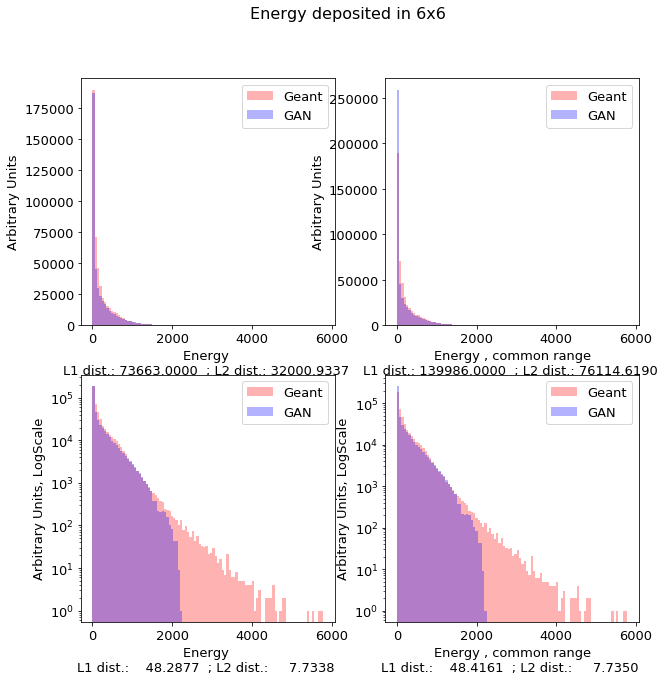

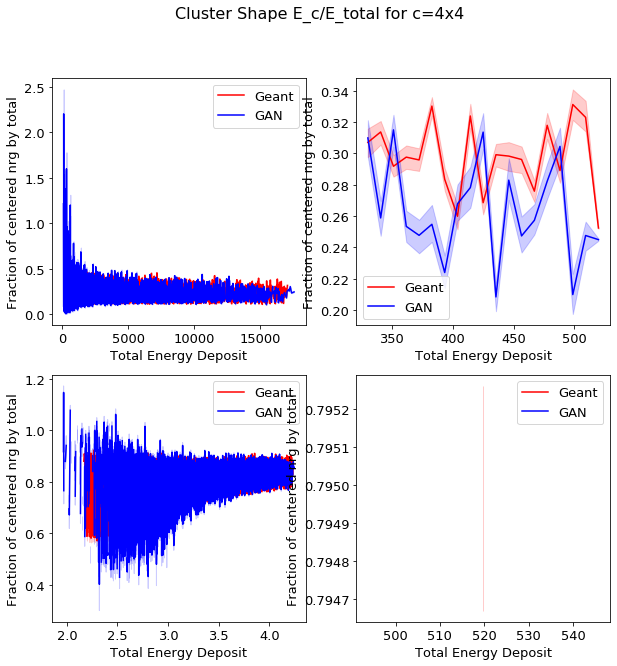

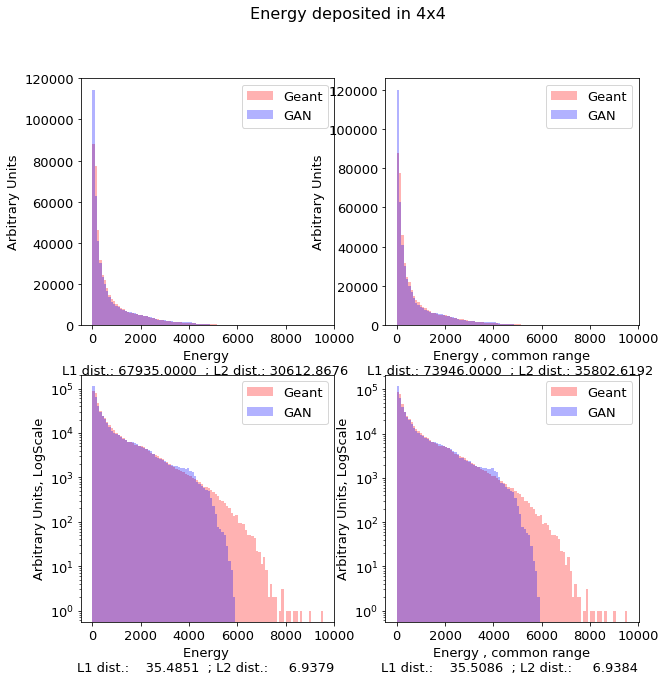

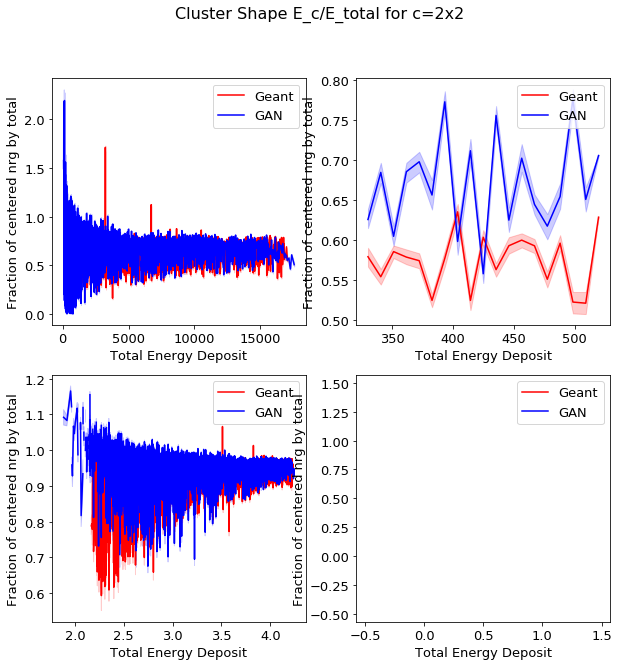

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning:

aspect is not supported for Axes with xscale=linear, yscale=log



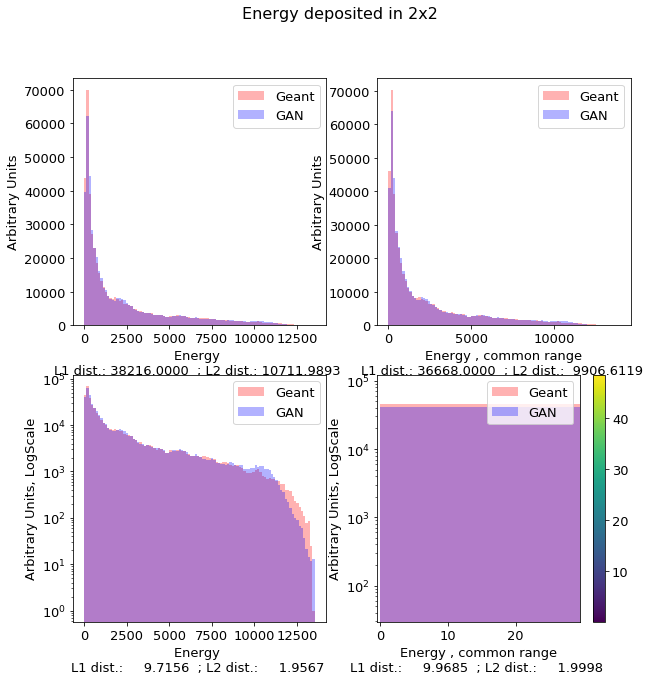

mkdir: cannot create directory ‘/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN’: File exists
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800.pdf' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800.pdf'
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_stats_generated.pdf' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN_9800_stats_generated.pdf'
'resources/computed/caloGAN_batch100_1of2_cLinearDeep_WGAN.pth' -> '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN/caloGAN_batch100_1of2_cLinearDeep_WGAN.pth'


In [0]:
from analytics import analytic_funcs as AF
from analytics import optimized_analytic_funcs as OAF
  #evaluation phase
netG.eval(), netD.eval()
    
shape = ecalDataPojo.response.shape
print(shape)

with torch.no_grad():
  tonnsOfNoise = torch.randn(shape[0], nz, device=device)
  generated = netG([tonnsOfNoise, condition.to(device)])
  fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

ecalStatsPath = 'resources/computed/' + datasetName + '_stats' + '.pth'
if not iogan.isFilePresent(ecalStatsPath): 
  ecalStats = OAF.optimized_analityc(ecalDataPojo, imgSize)
  torch.save(ecalStats, ecalStatsPath)
else :
  print('Found calculated stats ' + ecalStatsPath)
  ecalStats = OAF.EcalStats(torch.load(ecalStatsPath))
est, fakeStats = OAF.runAnalytics('/' + pdfFile, ecalDataPojo, fakeData, ecalStats)

plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
plt.colorbar()
plt.show()
  
  #finally we want to save our results to mounted GoogleDrive
%mkdir   '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN'
%cp -v $ganFile*  '/ecal/My Drive/ecal/C_2020/cLinearGan_WGAN'  

In [0]:
  ecalStatsPath = 'resources/computed/' + datasetName + '_stats' + '.pth'
  if not iogan.isFilePresent(ecalStatsPath): 
    ecalStats = OAF.optimized_analityc(ecalDataPojo, imgSize)
    torch.save(ecalStats, ecalStatsPath)

(50000, 30, 30)
EnergyDeposit  shape: (50000, 30, 30)
 min: 0.0; max: 10100.986
 first particle Momentum :  [-0.299  0.078  3.286]
 Point :[  1.73   -0.245 -19.8  ]
 particle type is : 22



/content/diving-deep-learning/analytics/plotAnalytics.py:40: RuntimeWarning: divide by zero encountered in log10
  if logScale: combined = np.log10(combined)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: divide by zero encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: invalid value encountered in log10
  return nparray if not logScaled else np.log10(nparray)


KeyboardInterrupt: ignored

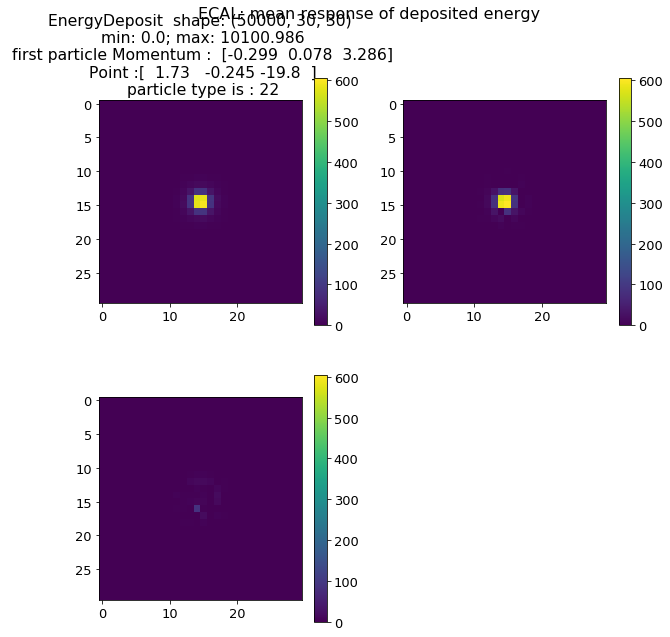

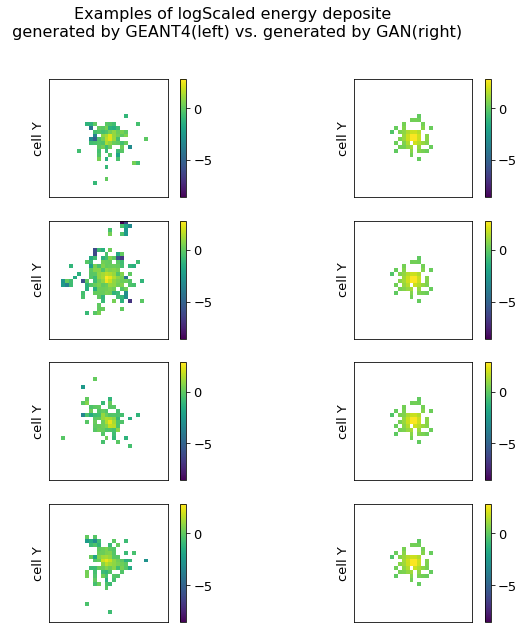

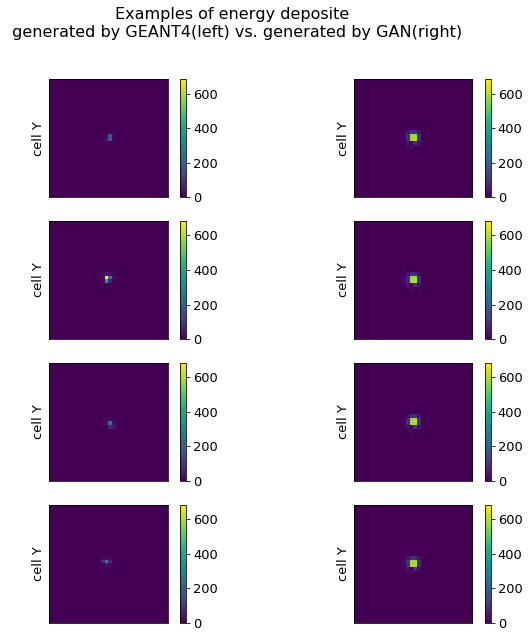

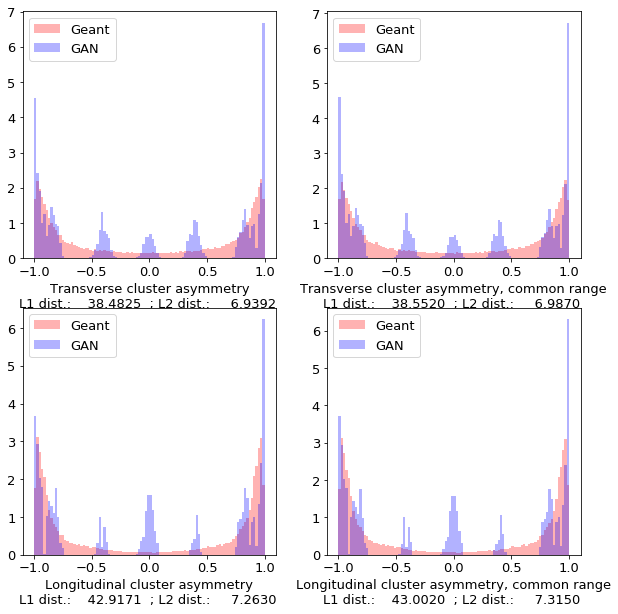

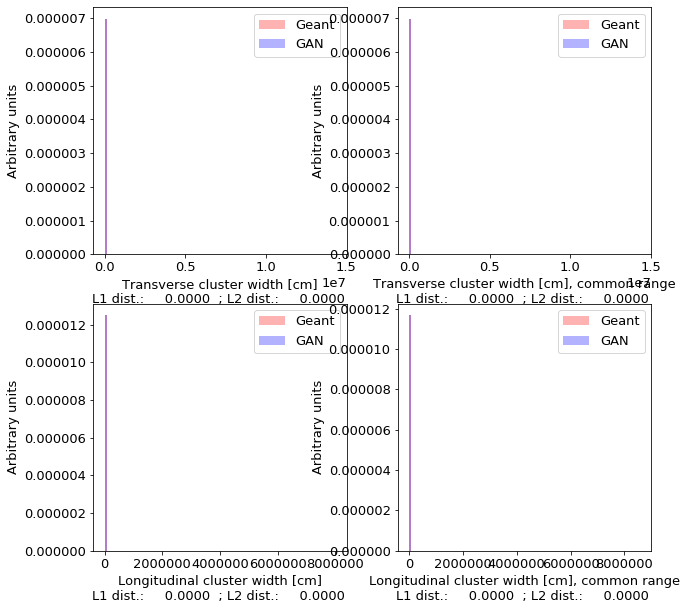

...

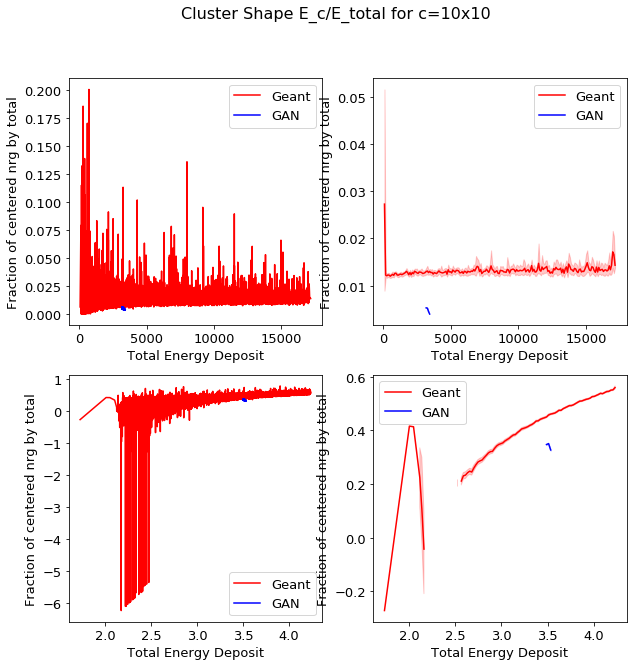

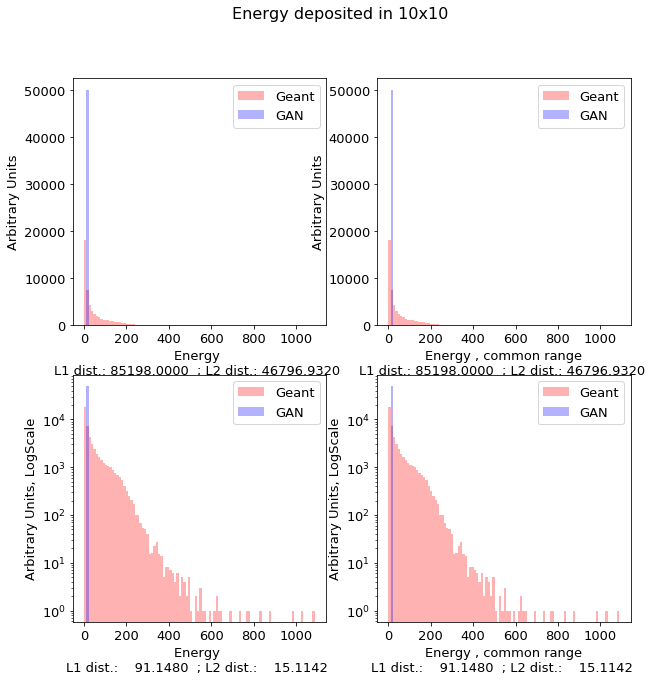

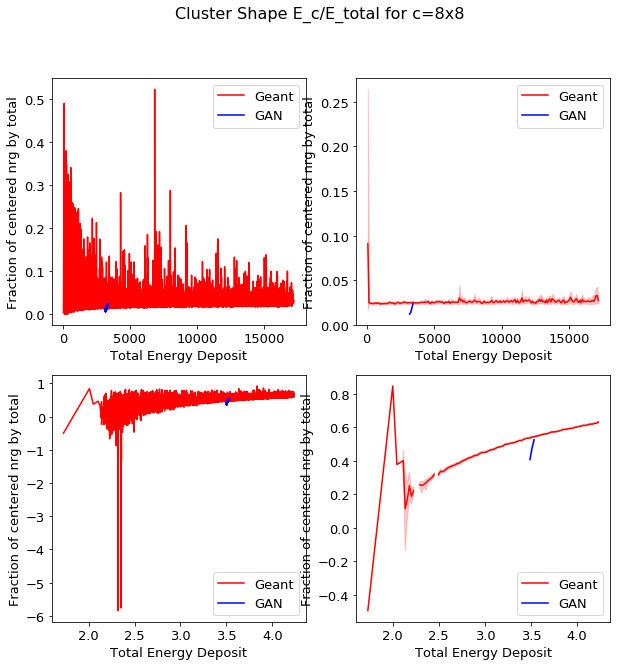

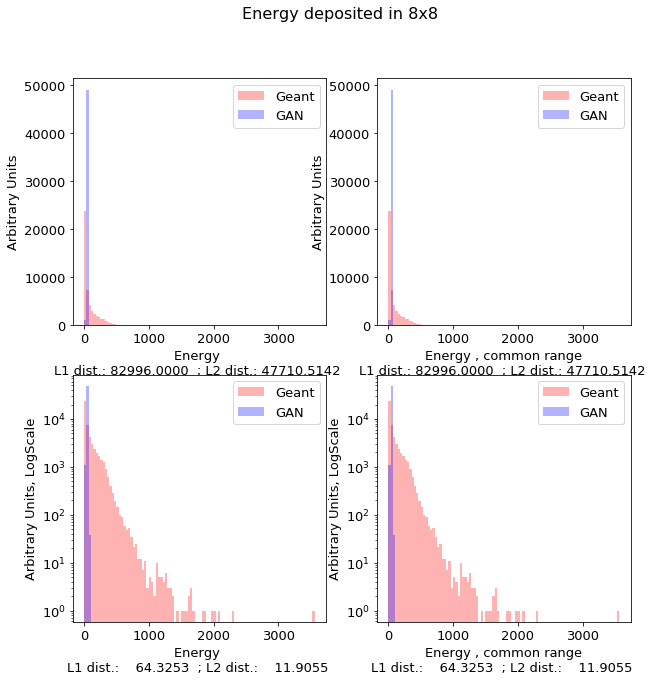

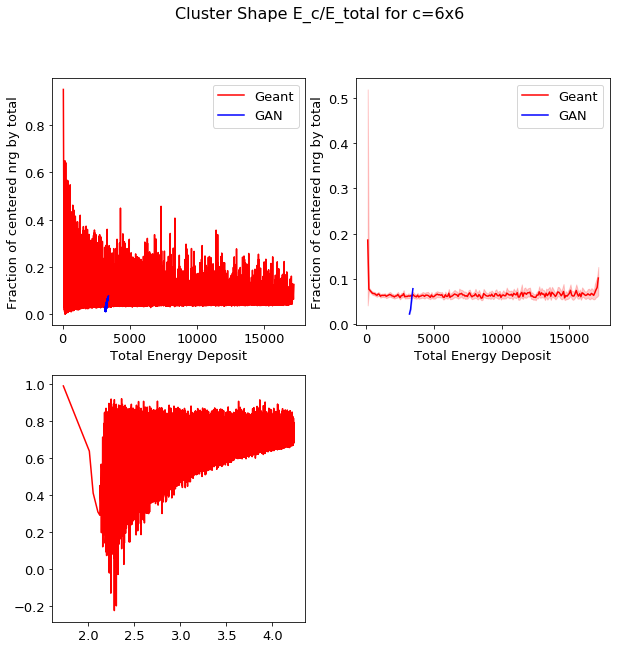

In [0]:
  #evaluation phase
  netG.eval(), netD.eval()
    
  shape = ecalDataPojo.response.shape
  print(shape)

  with torch.no_grad():
    tonnsOfNoise = torch.randn(shape[0], nz, device=device)
    generated = netG([tonnsOfNoise, condition.to(device)])
    fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

  OAF.runAnalytics('/' + pdfFile, ecalDataPojo, fakeData)

  plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
  plt.colorbar()
  plt.show()
  
  #finally we want to save our results to mounted GoogleDrive
  #%mkdir   '/ecal/My Drive/ecal/CONDITIONAL/cLinearGan2'
  #%cp -v $ganFile*  '/ecal/My Drive/ecal/CONDITIONAL/cLinearGan2'

/
/ecal/My Drive/ecal
/
/content/diving-deep-learning
(50000, 30, 30)
EnergyDeposit  shape: (50000, 30, 30)
 min: 0.0; max: 299.985
 first particle Momentum :  [0.157 0.147 2.446]
 Point :[ -1.007  -0.965 -19.8  ]
 particle type is : 22



/content/diving-deep-learning/analytics/plotAnalytics.py:40: RuntimeWarning: divide by zero encountered in log10
  if logScale: combined = np.log10(combined)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: divide by zero encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: invalid value encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: divide by zero encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: invalid value encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: divide by zero encountered in log10
  return nparray if not logScaled else np.log1

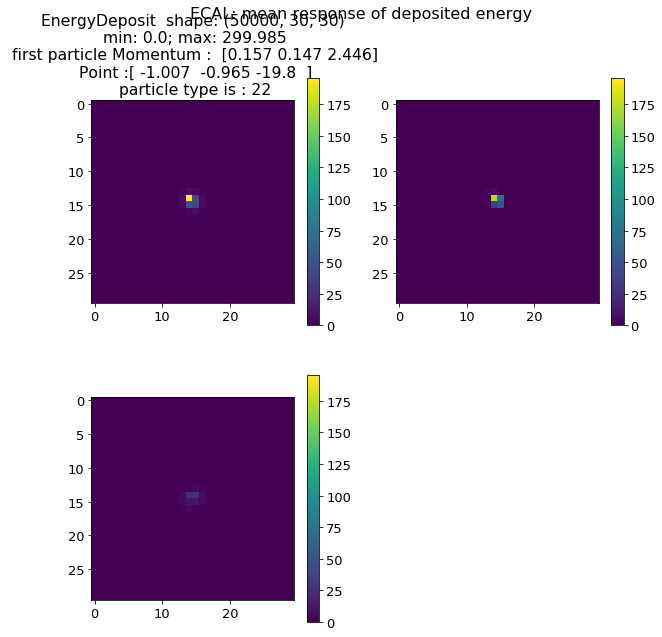

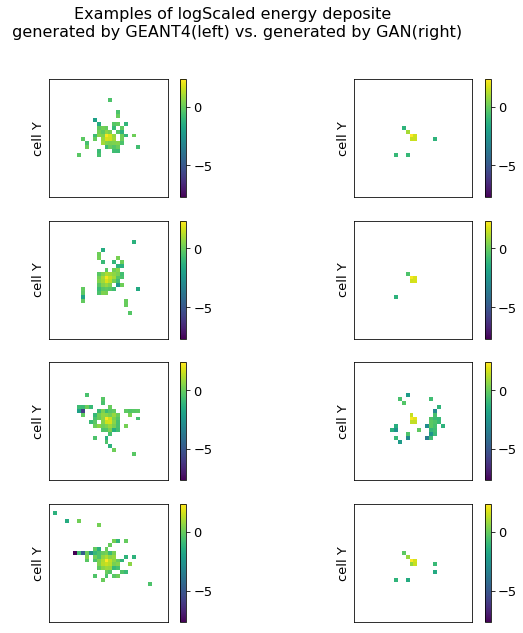

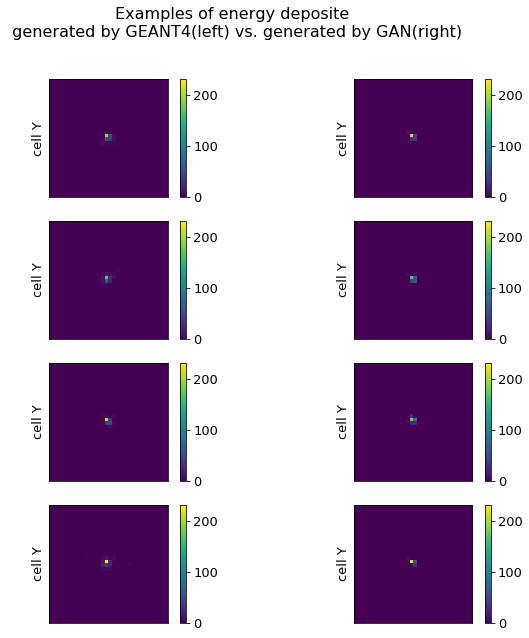

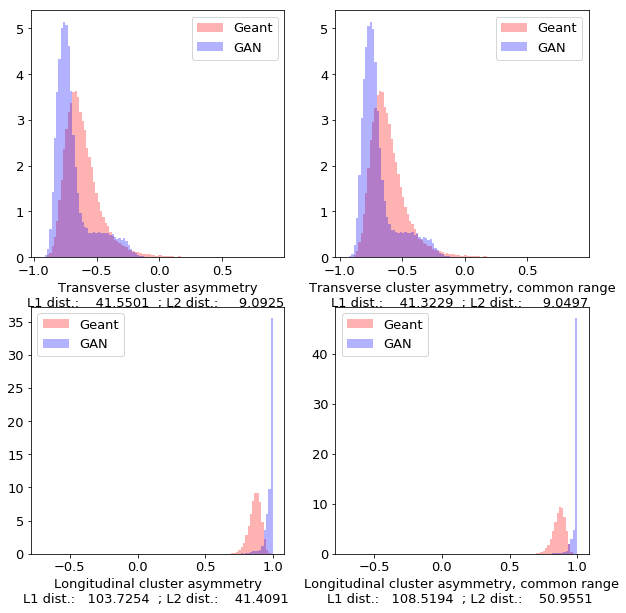

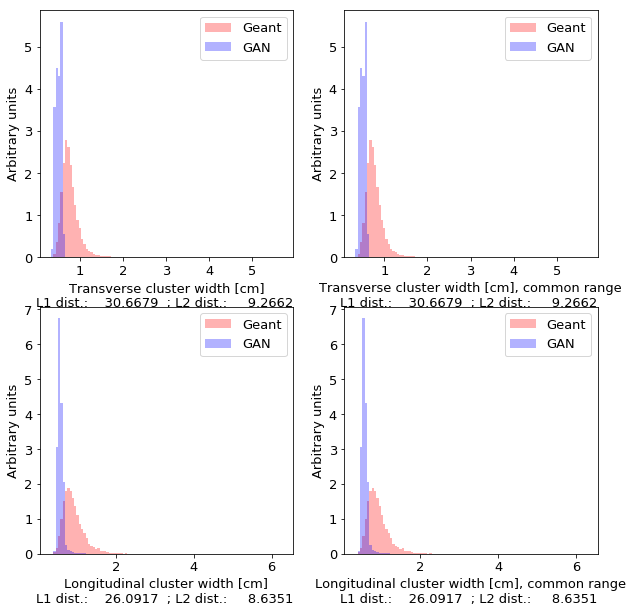

...

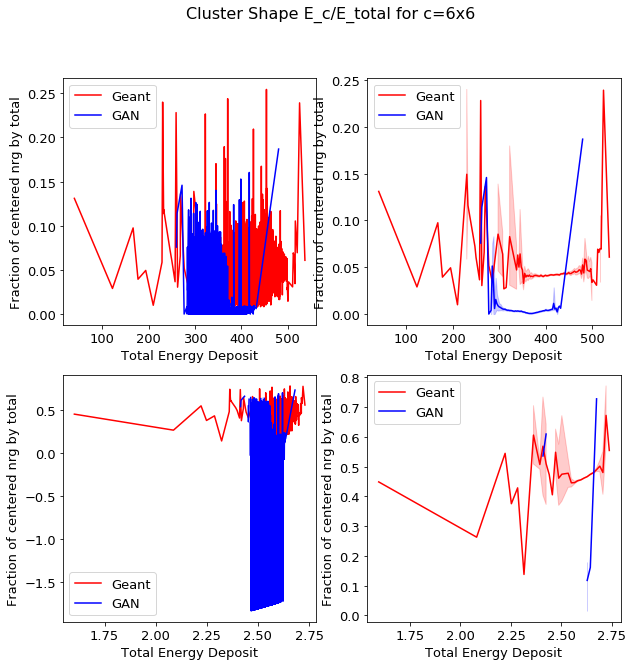

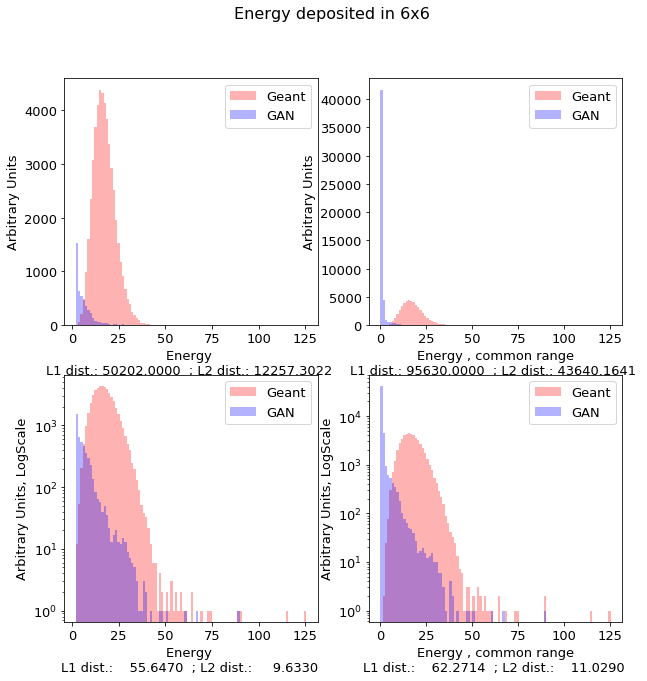

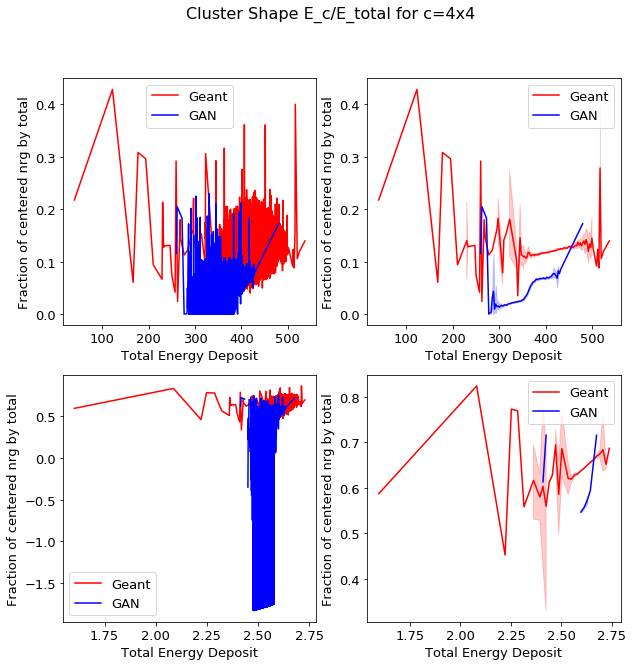

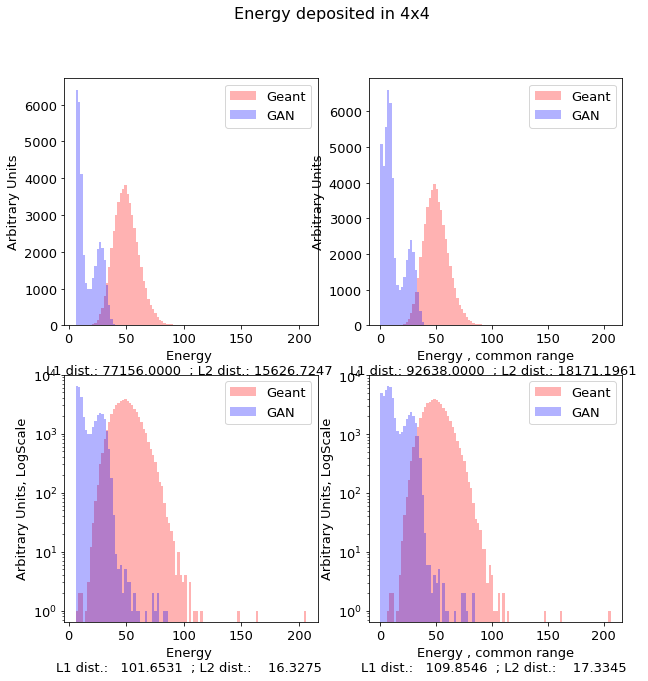

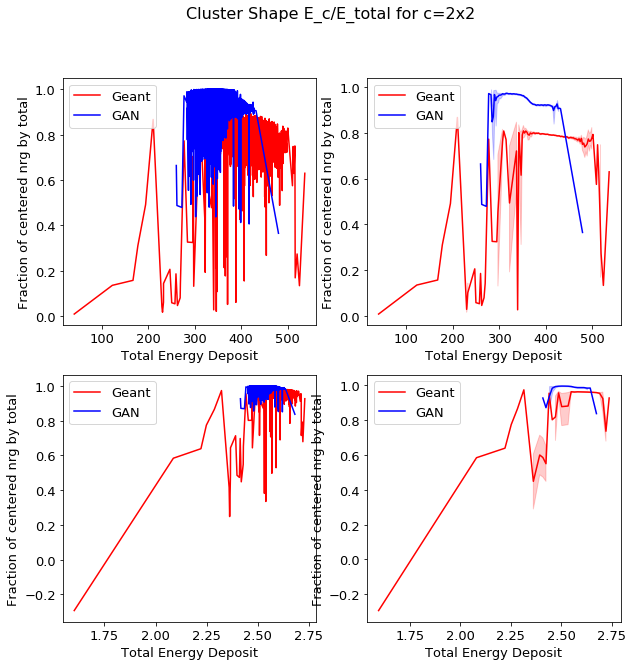

/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:2575: UserWarning: aspect is not supported for Axes with xscale=linear, yscale=log
  self.apply_aspect()
/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:4371: UserWarning: aspect is not supported for Axes with xscale=linear, yscale=log
  self.apply_aspect()
/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:848: UserWarning: aspect is not supported for Axes with xscale=linear, yscale=log
  self.apply_aspect()


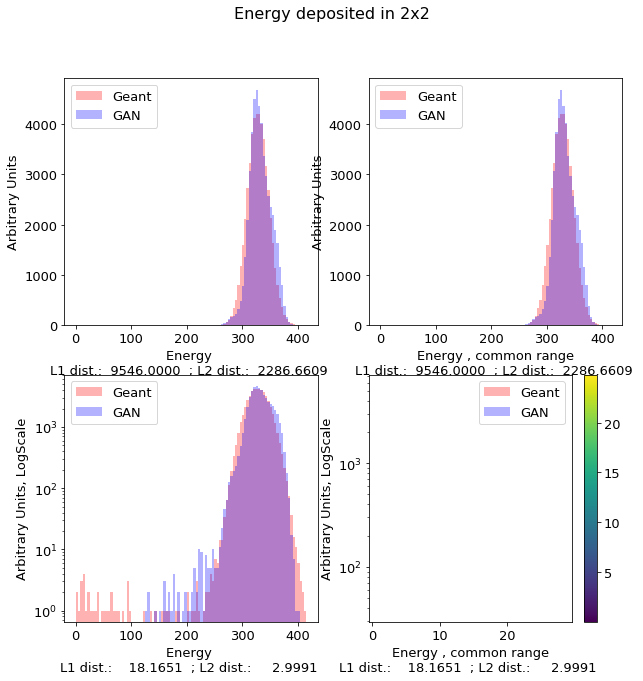

In [0]:
%cd /
%cd ecal/My Drive/ecal

datasetName2 = 'caloGAN_v4_case2_50K'
ecalData2 = np.load('%s.npz' % datasetName2)


%cd /
%cd content/diving-deep-learning/

ecalDataPojo2 = domain.ecaldata.dictToEcalData(ecalData2)

toFloatTensor = lambda eds: torch.from_numpy(eds).float()
energyDepo2 = toFloatTensor(ecalDataPojo2.response)
condition2 = torch.cat([toFloatTensor(ecalDataPojo2.point)[..., :2], toFloatTensor(ecalDataPojo2.momentum)], 1)

netG.eval(), netD.eval()
    
shape2 = ecalDataPojo2.response.shape
print(shape2)

with torch.no_grad():
  tonnsOfNoise = torch.randn(shape[0], nz, device=device)
  generated = netG([tonnsOfNoise, condition2.to(device)])
  fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo2.momentum, ecalDataPojo2.point)

OAF.runAnalytics('/' + pdfFile + 'Validation', ecalDataPojo2, fakeData)

plt.imshow(abs(np.mean(ecalDataPojo2.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
plt.colorbar()
plt.show()


In [0]:
def plotLosses(G_losses, D_losses):
    plt.figure()
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(G_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()

def plotGradPenalties(penalties, norms):
    plt.figure()
    plt.title("Gradient Penalties and Norms During Training")
    plt.plot(penalties, label="P")
    plt.plot(norms, label="N")
    plt.xlabel("iterations")
    plt.ylabel("Value")
    plt.legend()

In [0]:
shape = ecalDataPojo.response.shape
print(shape)
ecalNetsPrefix = '/ecal/My Drive/ecal/testResize8_LIN/'
netNames = [#'testResize8_LINEAR/caloGAN_v3_case2_50K_dcganBatchNorm_resize8_LIN', 
            'caloGAN_v3_case2_50K_dcganBatchNorm_resize8_LIN',
            'caloGAN_v3_case2_50K_dcganBatchNorm_resize8_LIN10k',
            'caloGAN_v3_case2_50K_dcganBatchNorm_resize8_LIN10k10k_gp10']
            
            #'testResize8/caloGAN_v3_case2_50K_dcganBatchNorm_resize8_BN_CRAMER']

#cpnt = torch.load(ecalNetsPrefix + netNames[0] + iogan.EXTENSION)    
    
tonnsOfNoise = torch.randn(shape[0], nz, 1, 1, device=device)
#ecalStats = OAF.optimized_analityc(ecalDataPojo, imgSize)

def runStats(netName):
  checkpoint = torch.load(ecalNetsPrefix + netName + iogan.EXTENSION)

  netD.load_state_dict(checkpoint['D_state'])
  netG.load_state_dict(checkpoint['G_state'])
  netG.eval(), netD.eval()

#%cd /
#%cd content/
#ecalData = AF.parseEcalData(datasetName)

#%cd /
#%cd content/diving-deep-learning/
    

  with torch.no_grad():
    generated = netG(tonnsOfNoise)
    fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

    OAF.runAnalytics('/' + netName, ecalDataPojo, fakeData, ecalStats)

    plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
    plt.colorbar()
    plt.show()  
    
    
for netName in netNames:
  runStats(netName)




In [0]:
#ganFile = resultingName
#checkpoint = torch.load(ganFile + '.pth.pth')
#checkpoint.keys()
cpnt.keys()

dict_keys(['fixedNoise', 'D_state', 'G_state', 'Dopt', 'Gopt', 'epoch', 'DLoss', 'GLoss'])

(50000, 30, 30)
EnergyDeposit  shape: (50000, 30, 30)
 min: 0.0; max: 299.985
 first particle Momentum :  [0.157 0.147 2.446]
 Point :[ -1.007  -0.965 -19.8  ]
 particle type is : 22



/content/diving-deep-learning/analytics/plotAnalytics.py:40: RuntimeWarning: divide by zero encountered in log10
  if logScale: combined = np.log10(combined)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: divide by zero encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: invalid value encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: divide by zero encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: invalid value encountered in log10
  return nparray if not logScaled else np.log10(nparray)
/content/diving-deep-learning/analytics/plotAnalytics.py:156: RuntimeWarning: divide by zero encountered in log10
  return nparray if not logScaled else np.log1

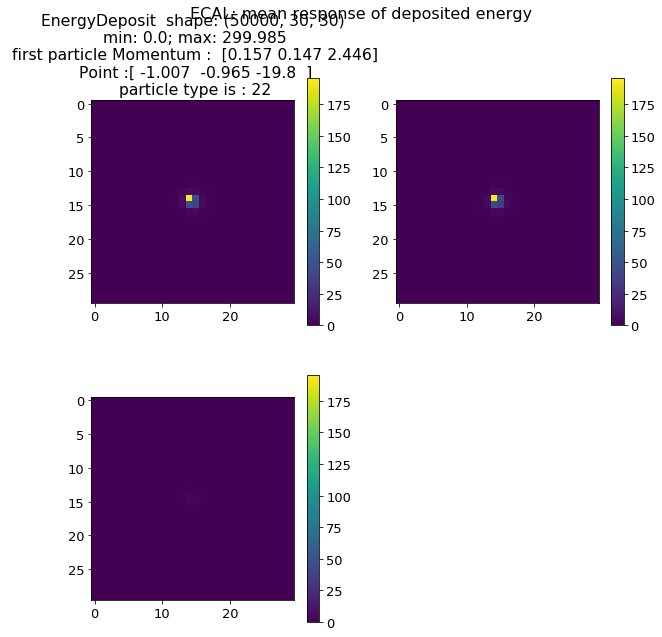

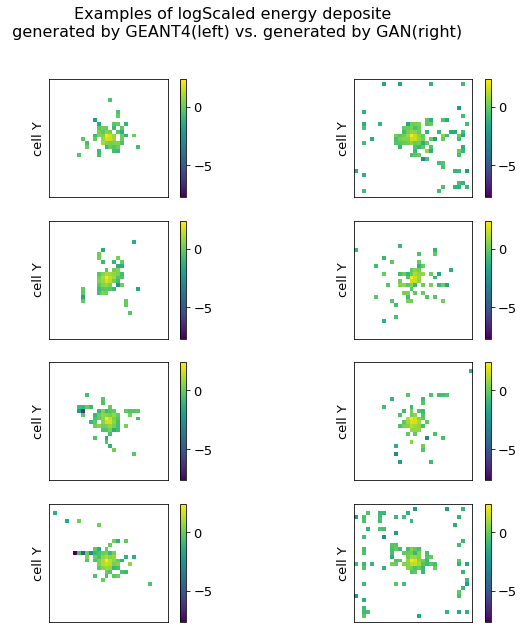

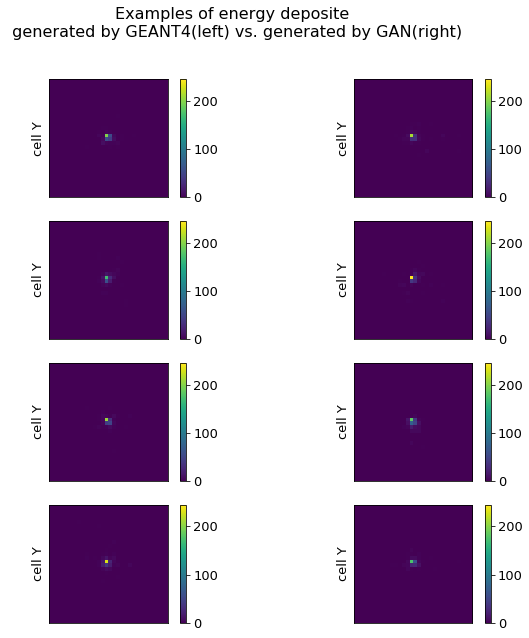

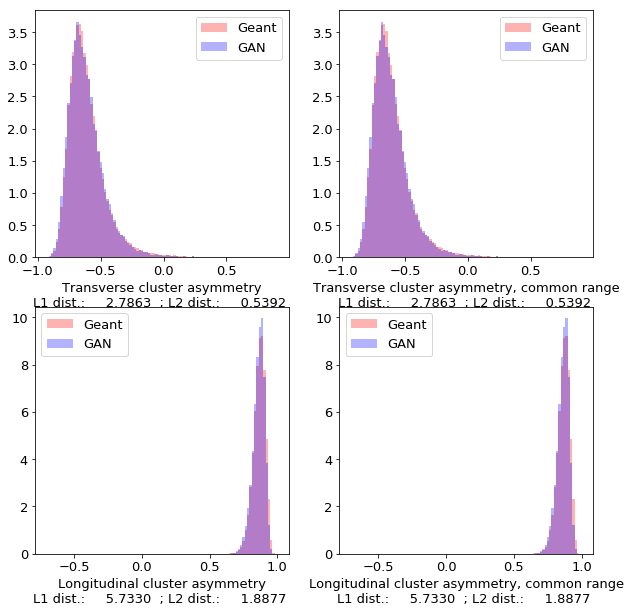

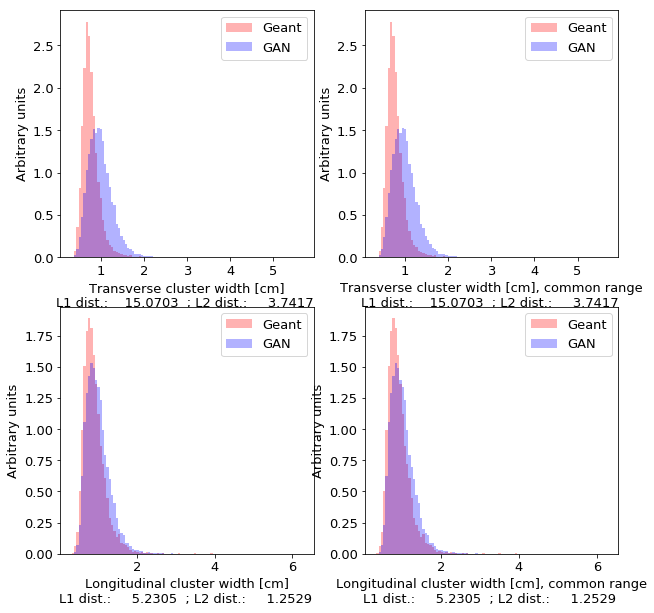

...

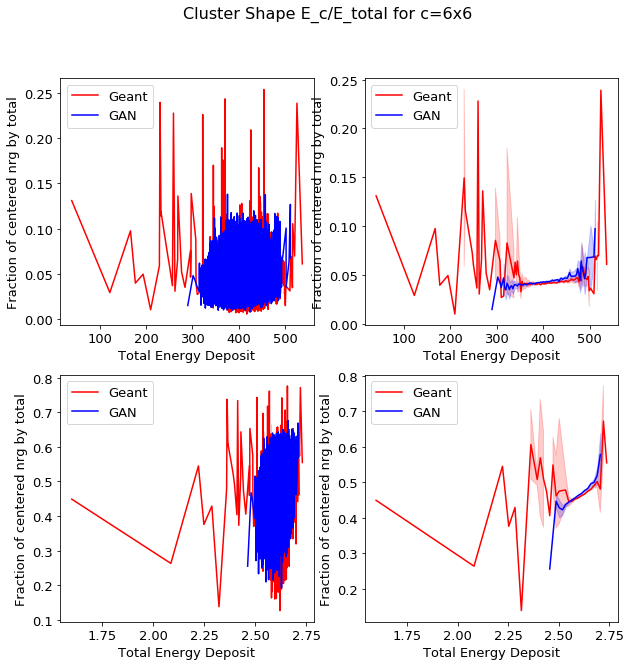

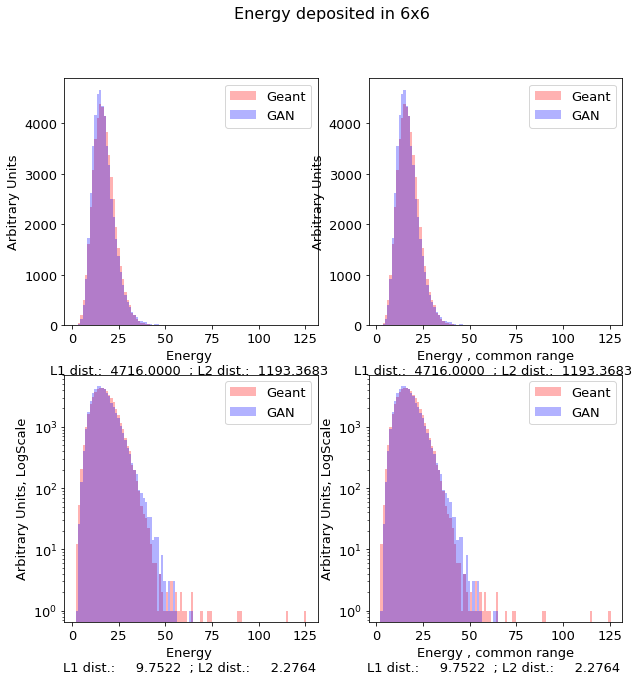

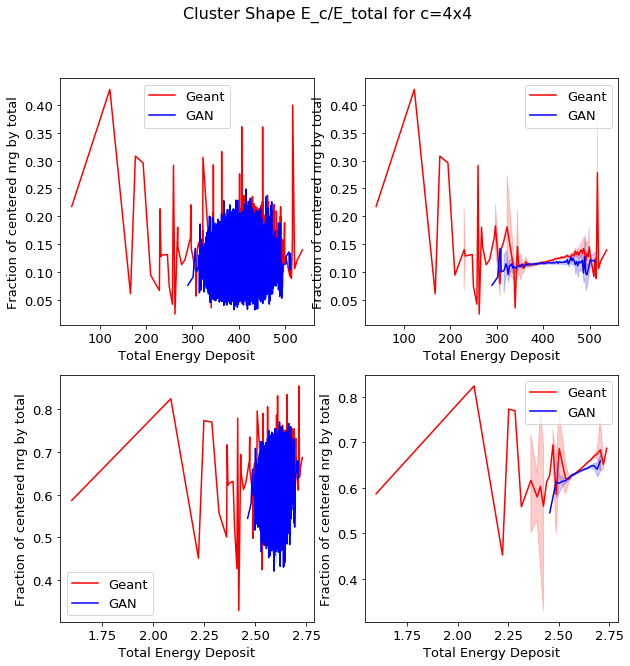

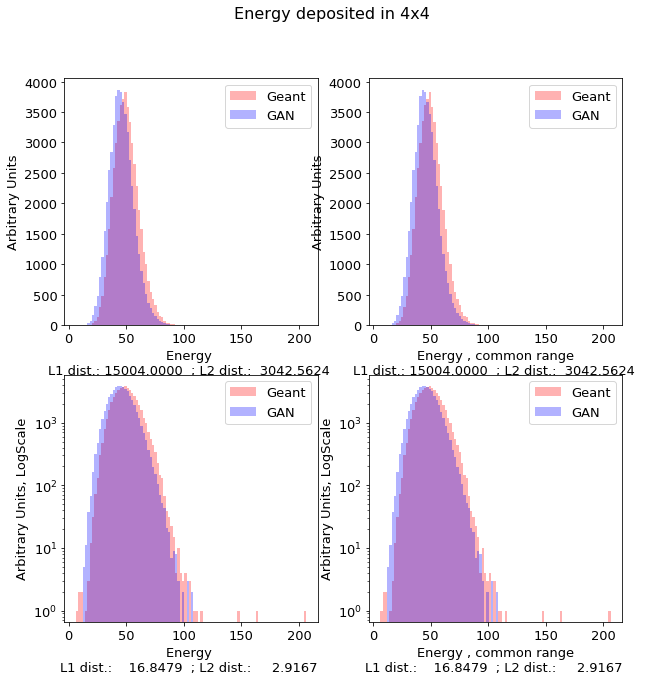

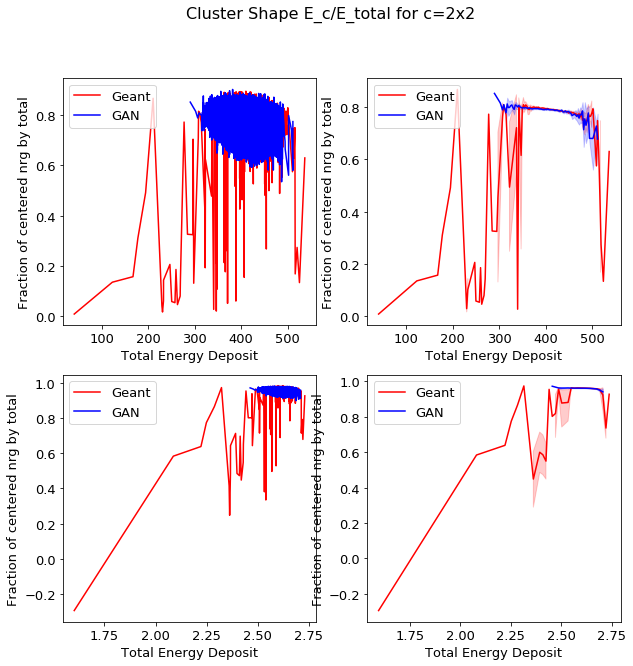

/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:2575: UserWarning: aspect is not supported for Axes with xscale=linear, yscale=log
  self.apply_aspect()
/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:4371: UserWarning: aspect is not supported for Axes with xscale=linear, yscale=log
  self.apply_aspect()
/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:848: UserWarning: aspect is not supported for Axes with xscale=linear, yscale=log
  self.apply_aspect()


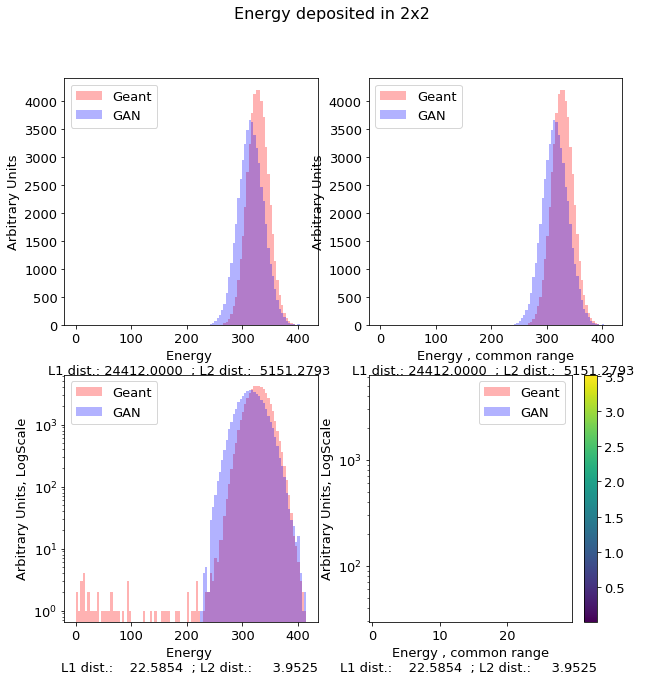

In [0]:
  #evaluation phase
  netG.eval(), netD.eval()
    
  shape = ecalDataPojo.response.shape
  print(shape)

  with torch.no_grad():
    tonnsOfNoise = torch.randn(shape[0], nz, 1, 1, device=device)
    generated = netG(tonnsOfNoise)
    fakeData = domain.ecaldata.EcalData(generated.reshape(shape).cpu().numpy(), ecalDataPojo.momentum, ecalDataPojo.point)

  OAF.runAnalytics('/' + ganFile, ecalDataPojo, fakeData)

  plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))  
  plt.colorbar()
  plt.show()       

In [0]:
#%cp -v $ganFile*   '/ecal/My Drive/ecal/testDiffBatchSize'
%mkdir   '/ecal/My Drive/ecal/dcgan_BN_FC'
#%cp -v resources/computed/caloGAN_v3_case2_50K_dcganBatchNorm_resize*  '/ecal/My Drive/ecal/testResize8'

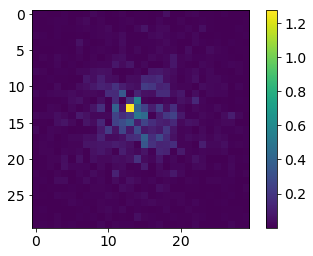

In [0]:
if (ecalDataPojo.response.shape[0] == fakeData.response.shape[0]) :
  plt.imshow(abs(np.mean(ecalDataPojo.response, axis=0, keepdims=False) - np.mean(fakeData.response, axis=0, keepdims=False)))
  plt.colorbar()
  plt.show()

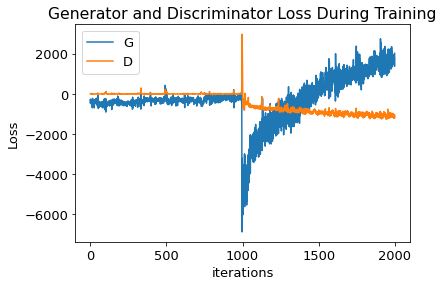

In [0]:
lalalala = 2000
painters.plotLosses(ganTrainer.G_losses[-lalalala:], ganTrainer.D_losses[-lalalala:])
#painters.plotLosses(ganTrainer.ganLoss.gradientPenalizer.penalties[-lalalala:], ganTrainer.ganLoss.gradientPenalizer.norms[-lalalala:])

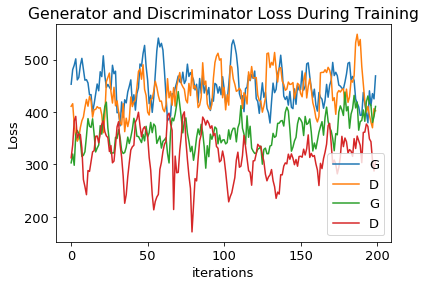

In [0]:
lalalala = 200
painters.plotLosses(ganTrainer.G_losses[-lalalala:], ganTrainer.G_losses[-2*lalalala:-lalalala])
painters.plotLosses(ganTrainer.G_losses[-3*lalalala:-2*lalalala], ganTrainer.G_losses[-4*lalalala:-3*lalalala])


In [0]:
  #finally we want to save our results to mounted GoogleDrive
  %mkdir   '/ecal/My Drive/ecal/CONDITIONAL/cLinearGan_bs100'
  %cp -v $ganFile*  '/ecal/My Drive/ecal/CONDITIONAL/cLinearGan_bs100' 

'resources/computed/caloGAN_v4_case0_50K_cLinearGan_bs100_100.pdf' -> '/ecal/My Drive/ecal/CONDITIONAL/cLinearGan_bs100/caloGAN_v4_case0_50K_cLinearGan_bs100_100.pdf'
'resources/computed/caloGAN_v4_case0_50K_cLinearGan_bs100_100_stats_generated.pdf' -> '/ecal/My Drive/ecal/CONDITIONAL/cLinearGan_bs100/caloGAN_v4_case0_50K_cLinearGan_bs100_100_stats_generated.pdf'
'resources/computed/caloGAN_v4_case0_50K_cLinearGan_bs100.pth' -> '/ecal/My Drive/ecal/CONDITIONAL/cLinearGan_bs100/caloGAN_v4_case0_50K_cLinearGan_bs100.pth'
